In [1]:
#pip install --upgrade --force-reinstall matplotlib

In [1]:
import pandas as pd
import numpy as np
import json
import re

In [2]:
import matplotlib as plt

In [3]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

#### Učitavanje podataka

In [4]:
data_attrition=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [5]:
data_attrition

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


#### Proveravanje null vrednosti u skupu podataka

In [6]:
data_attrition.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
##### Proveravamo da li nam se u skupu podataka 
maska = data_attrition.isnull() | (data_attrition == '') | (data_attrition == 'None') | (data_attrition == ' ')

In [8]:
broj_null_vrednosti = maska.sum()
print(broj_null_vrednosti)

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [9]:
### Provera duplikata je takodje jedna od tehnika koje su neophodne u generisanju i preprocesiranju modela mašinskog učenja
## Nekada se radi svesno oversemplovanje ili undersamplovanje skupa podataka za treniranje medjutim u ovom slučaju je
# bolje na početku proveriti i uveriti se da li u samom startu postoje vrednosti koje su duplirane
### 

In [10]:
podaci_duplirani= data_attrition.duplicated()

In [11]:
# SADA DA VIDIMO DA LI SU PODACI DUPLIRANI
data_attrition[podaci_duplirani]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [12]:
#-Podaci u početnom skupu podataka nisu duplirani i nalaze se normalno 

In [13]:
#### Provera unique vrednosti unutar kolona 
#### kako bi izbegle i izbrisale konstantne vrednosti u skupu podataka koje nisu korisne ili su neke informacije
### poput ID kolona koji nisu kasnije relevantne za analizu

In [14]:
data_attrition.shape

(1470, 35)

In [15]:
for kolona in data_attrition.columns:
    print(f"{kolona}: Ima jedinstvenih vrednosti {data_attrition[kolona].nunique()}")
    print("######################################################")

Age: Ima jedinstvenih vrednosti 43
######################################################
Attrition: Ima jedinstvenih vrednosti 2
######################################################
BusinessTravel: Ima jedinstvenih vrednosti 3
######################################################
DailyRate: Ima jedinstvenih vrednosti 886
######################################################
Department: Ima jedinstvenih vrednosti 3
######################################################
DistanceFromHome: Ima jedinstvenih vrednosti 29
######################################################
Education: Ima jedinstvenih vrednosti 5
######################################################
EducationField: Ima jedinstvenih vrednosti 6
######################################################
EmployeeCount: Ima jedinstvenih vrednosti 1
######################################################
EmployeeNumber: Ima jedinstvenih vrednosti 1470
######################################################
EnvironmentSatisfactio

In [16]:
for kolona in data_attrition.columns:
    if data_attrition[kolona].nunique()==1:
        print(f"{kolona}: Ima jednu jedinstvenu vrednosti {data_attrition[kolona].nunique()}")
        print("######################################################")
    elif data_attrition[kolona].nunique()==data_attrition.shape[0]:
        print(f"{kolona}: Ima sve različite vrednosti")
        print("######################################################")
        

EmployeeCount: Ima jednu jedinstvenu vrednosti 1
######################################################
EmployeeNumber: Ima sve različite vrednosti
######################################################
Over18: Ima jednu jedinstvenu vrednosti 1
######################################################
StandardHours: Ima jednu jedinstvenu vrednosti 1
######################################################


In [18]:
## pre nego što ove informacije budu iskorišćene za prečišćavanje skupa podataka možemo videti raspodelu

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'DailyRate'}>,
        <Axes: title={'center': 'DistanceFromHome'}>,
        <Axes: title={'center': 'Education'}>,
        <Axes: title={'center': 'EmployeeCount'}>],
       [<Axes: title={'center': 'EmployeeNumber'}>,
        <Axes: title={'center': 'EnvironmentSatisfaction'}>,
        <Axes: title={'center': 'HourlyRate'}>,
        <Axes: title={'center': 'JobInvolvement'}>,
        <Axes: title={'center': 'JobLevel'}>],
       [<Axes: title={'center': 'JobSatisfaction'}>,
        <Axes: title={'center': 'MonthlyIncome'}>,
        <Axes: title={'center': 'MonthlyRate'}>,
        <Axes: title={'center': 'NumCompaniesWorked'}>,
        <Axes: title={'center': 'PercentSalaryHike'}>],
       [<Axes: title={'center': 'PerformanceRating'}>,
        <Axes: title={'center': 'RelationshipSatisfaction'}>,
        <Axes: title={'center': 'StandardHours'}>,
        <Axes: title={'center': 'StockOptionLevel'}>,
        <Axe

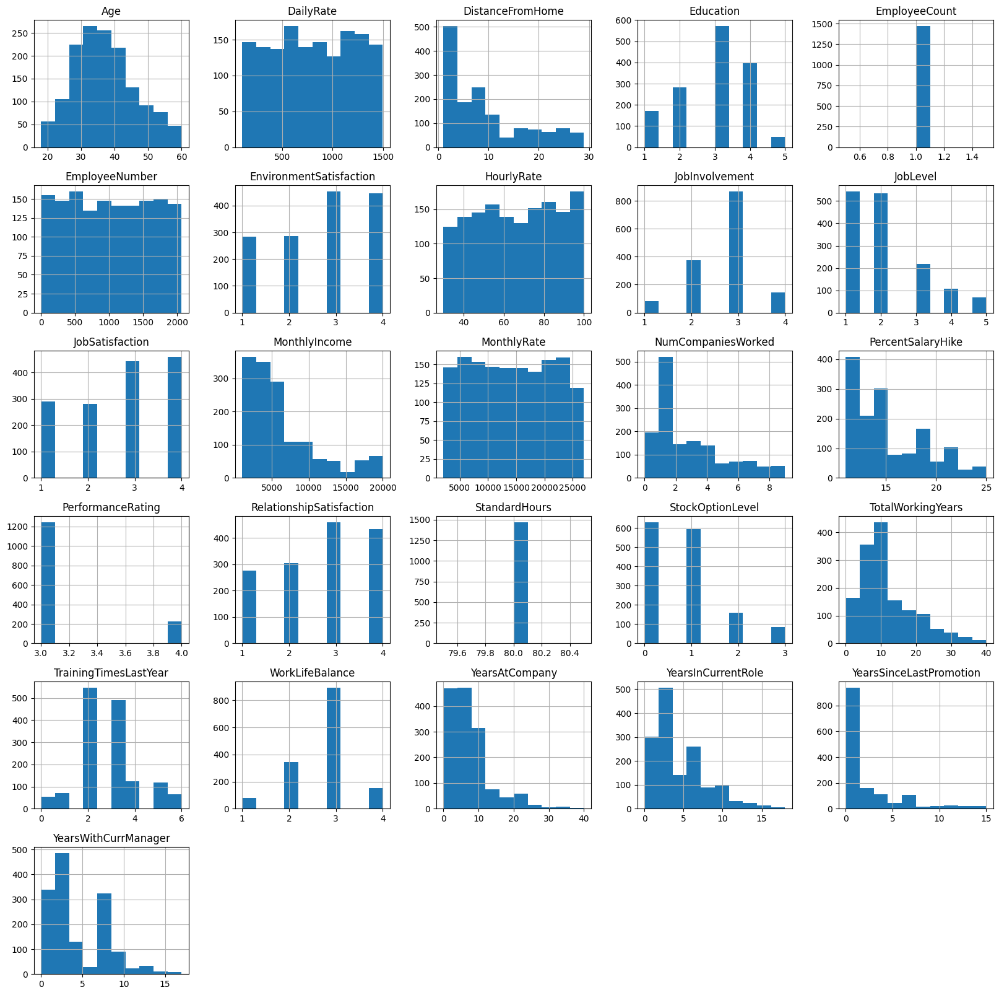

In [17]:
data_attrition.hist(figsize=(20,20))

In [20]:
# Na osnovu prikazanih histograma mogu se izneti sl. zaključci:
# - Dobra većina varijabli imaju distribuciju gde su krajevi raspodele izuzetno opterećeni,
## tako reći to su raspodele verovatnoća čiji repovi (krajevi) nisu eksponencijalno ograničeni. 
# To onda znači da oni opadaju sporije od ekponencijalne raspodele.
# u našem slučaju to bi značilo da većina varijabli ima raspodelu nakrivljenu na desno.
### Takođe vidimo da su neke varijable konstantne i da je moguće da se izbace i ne proučavaju dalje.

In [21]:
##### Ovde se zakljucuje da je neophodno ukoliti kolone koje imaju standardnu vrednost poput EmployeeCount, StandardHours Over18 a da
#varijabla EmployeeNumber predstavlja 

In [18]:
data_attrition.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True                      )

In [19]:
data_attrition.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [20]:
### yes - 1; no -0
label_encoder_output = LabelEncoder()
data_attrition['Attrition'] = label_encoder_output.fit_transform(data_attrition['Attrition'])

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [21]:
data_attrition.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [22]:
#data_attrition.head(5).to_csv("sample21.07.csv", index=False)

In [23]:
## sledeći korak je da se odradi uklanjanje outlier-a 
# - tu mogu da se koriste dve technike sada ćemo odraditi tehniku koriščenjem Z-score-a ali posto je takav vid uklanjanja oulier-a
## preporucljiv iskljucivo sa numerickim vrednostima potrebno je da se dobro razumeju sve kolone i shodno tome da se razdvoje
#### u odgovarajuće tipove podatka

In [24]:
data_attrition.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [25]:
numeričke_varijable=['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome',
                     'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears',
                    'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 
                    'YearsSinceLastPromotion', 'YearsWithCurrManager']

In [26]:
kategoričke_nominalne=['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']

In [27]:
izlazna_varijabla=['Attrition']

In [28]:
kategoričke_binarne=['Gender', 'OverTime']

In [29]:
kategoričke_ordinalne=['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 
                       'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction',
                       'StockOptionLevel', 'WorkLifeBalance']

In [30]:
sve_kategoricke=kategoričke_nominalne+kategoričke_binarne+kategoričke_ordinalne

In [33]:
###### Ispod je predstavljena tehnika otklanjanja outlier-a na osnovu z-scorea

In [31]:
data_attrition.shape

(1470, 31)

In [32]:
###
import numpy as np
from scipy import stats

In [33]:
########## IPAK JE POTREBNO UKLONITI OUTLIER-e tehnika menjanja oulier vrednosti sa donjim ili gornjim quantilom nije bila uspesna
z_skorovi = np.abs(stats.zscore(data_attrition[numeričke_varijable]))
data_attrition_outlier_cleaned = data_attrition[(z_skorovi < 3).all(axis=1)]

In [37]:
# def winsorize_series(series, lower_quantile=0.25, upper_quantile=0.75):
#     lower_bound = series.quantile(lower_quantile)
#     upper_bound = series.quantile(upper_quantile)
#     return np.clip(series, lower_bound, upper_bound)

In [38]:
# data_attrition_winsorized = data_attrition.copy()
# for var in numeričke_varijable:
#     data_attrition_winsorized[var] = winsorize_series(data_attrition[var])

In [39]:
# print(data_attrition_winsorized[numeričke_varijable].describe())

In [40]:
#data_attrition_outlier_cleaned =data_attrition_winsorized

In [34]:
data_attrition_outlier_cleaned.shape

(1387, 31)

In [42]:
#### Sledeći korak jeste feature engineering u kome ćemo dodati odredjene izvedene varijable


In [43]:
# data_attrition_obogacen= data_attrition_outlier_cleaned.copy()

In [44]:
# data_attrition_obogacen['YearsAtCompany_ManagerRatio'] = data_attrition_obogacen['YearsAtCompany'] / (data_attrition_obogacen['YearsWithCurrManager'] + 1)
# data_attrition_obogacen['SalaryIncreasePerYear']=(data_attrition_obogacen['MonthlyIncome']-data_attrition_obogacen['DailyRate']*22) / data_attrition_obogacen['YearsAtCompany']

In [35]:
data_attrition_obogacen=data_attrition_outlier_cleaned

In [36]:
data_attrition_obogacen.shape

(1387, 31)

In [47]:
### sada se dodaju ove dve numericke varijable u numericke varijable i onda je potrebno da će biti odradjena 
##odgovarajuća konverzija kategorickih varijabli u numerickih kao i skaliranje numerickih varijabli

In [48]:
# numeričke_varijable.append('YearsAtCompany_ManagerRatio')
# numeričke_varijable.append('SalaryIncreasePerYear')

In [37]:
numeričke_varijable

['Age',
 'DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [50]:
##### konverzija kategorickih u numericke

In [51]:
### prvo kategoricke ordinalne konvertujemo u ordinal varijable

In [38]:
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

In [39]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [40]:
from tqdm import tqdm

In [41]:
from sklearn.preprocessing import OneHotEncoder

one_hot_encoder = OneHotEncoder(sparse=False, drop='first')
nominalne_kategorije = ['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']

one_hot_encoded = one_hot_encoder.fit_transform(data_attrition_obogacen[nominalne_kategorije])
one_hot_encoded_df = pd.DataFrame(one_hot_encoded, columns=one_hot_encoder.get_feature_names_out(nominalne_kategorije))

In [42]:
print(data_attrition_obogacen.shape)
print(one_hot_encoded_df.shape)

(1387, 31)
(1387, 19)


In [43]:
data_attrition_obogacen.reset_index(drop=True, inplace=True)
one_hot_encoded_df.reset_index(drop=True, inplace=True)

In [44]:
one_hot_encoded_df

,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [46]:
new_nominal_kategorije=list(one_hot_encoded_df.columns)

In [47]:
new_nominal_kategorije

['BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'Department_Research & Development',
 'Department_Sales',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'JobRole_Human Resources',
 'JobRole_Laboratory Technician',
 'JobRole_Manager',
 'JobRole_Manufacturing Director',
 'JobRole_Research Director',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive',
 'JobRole_Sales Representative',
 'MaritalStatus_Married',
 'MaritalStatus_Single']

In [48]:
one_hot_encoder.get_feature_names_out(nominalne_kategorije)

array(['BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'EducationField_Technical Degree', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Research Scientist', 'JobRole_Sales Executive',
       'JobRole_Sales Representative', 'MaritalStatus_Married',
       'MaritalStatus_Single'], dtype=object)

In [49]:
data_attrition_obogacen = pd.concat([data_attrition_obogacen, one_hot_encoded_df], axis=1)
print(data_attrition_obogacen.isnull().sum())

Age                                  0
Attrition                            0
BusinessTravel                       0
DailyRate                            0
Department                           0
DistanceFromHome                     0
Education                            0
EducationField                       0
EnvironmentSatisfaction              0
Gender                               0
HourlyRate                           0
JobInvolvement                       0
JobLevel                             0
JobRole                              0
JobSatisfaction                      0
MaritalStatus                        0
MonthlyIncome                        0
MonthlyRate                          0
NumCompaniesWorked                   0
OverTime                             0
PercentSalaryHike                    0
PerformanceRating                    0
RelationshipSatisfaction             0
StockOptionLevel                     0
TotalWorkingYears                    0
TrainingTimesLastYear    

In [50]:
data_attrition_obogacen

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,0,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,39,0,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,27,0,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,49,0,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [51]:

data_attrition_obogacen.drop(columns=nominalne_kategorije, inplace=True)


In [52]:
data_attrition_obogacen

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,Female,94,3,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,279,8,1,3,Male,61,2,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,1373,2,2,4,Male,92,2,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,1392,3,4,4,Female,56,3,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,591,2,1,1,Male,40,3,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,0,884,23,2,3,Male,41,4,2,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,39,0,613,6,1,4,Male,42,2,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,27,0,155,4,3,2,Male,87,4,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,49,0,1023,2,3,4,Male,63,2,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [53]:
data_attrition_obogacen.columns

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobR

In [54]:
kategoricke_bez_nominalnih = kategoričke_binarne+kategoričke_ordinalne

In [55]:
le = LabelEncoder()
l1 = []; l2 = []; text_categorical_features = []
label_encoders={}
print('Pretvaranje kategorickih varijabli ')
for i in tqdm(kategoricke_bez_nominalnih):
    if type(data_attrition_obogacen[i][0]) == str:
        text_categorical_features.append(i)
        data_attrition_obogacen[i] = le.fit_transform(data_attrition_obogacen[i])
        label_encoders[i]=le
        l1.append(list(data_attrition_obogacen[i].unique())); l2.append(list(le.inverse_transform(data_attrition_obogacen[i].unique())))
        print(i,' : ',data_attrition_obogacen[i].unique(),' = ',le.inverse_transform(data_attrition_obogacen[i].unique()))

Pretvaranje kategorickih varijabli 


100%|██████████| 11/11 [00:00<00:00, 1439.81it/s]

Gender  :  [0 1]  =  ['Female' 'Male']
OverTime  :  [1 0]  =  ['Yes' 'No']


In [56]:
data_attrition_obogacen

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,0,94,3,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,279,8,1,3,1,61,2,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,1373,2,2,4,1,92,2,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,1392,3,4,4,0,56,3,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,591,2,1,1,1,40,3,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,36,0,884,23,2,3,1,41,4,2,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1383,39,0,613,6,1,4,1,42,2,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,27,0,155,4,3,2,1,87,4,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1385,49,0,1023,2,3,4,1,63,2,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [57]:
# tf1 = {}
# for i in range(len(text_categorical_features)):
#     tf1[text_categorical_features[i]] = {}
#     for j,k in zip(l1[i],l2[i]):
#         tf1[text_categorical_features[i]][j] = k

In [58]:
# label_encoders = {}
# for kolona in kategoričke_ordinalne:
#     le = LabelEncoder()
#     data_attrition_obogacen[kolona] = le.fit_transform(data_attrition_obogacen[kolona])
#     label_encoders[kolona] = le

In [59]:
# data_attrition_obogacen = pd.get_dummies(data_attrition_obogacen, columns= kategoričke_nominalne + kategoričke_binarne, drop_first=True)

In [60]:
#### Sada se koristi Standard Scaler za skaliranje numerickih varijabli

In [61]:
# ###3 ! ovo je zbog izvedenih varijabli 
# data_attrition_obogacen.replace([np.inf, -np.inf], np.nan, inplace=True)
# data_attrition_obogacen.dropna(inplace=True)

In [62]:
# data_attrition_obogacen.shape

In [63]:
data_attrition_obogacen.columns

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Research & Development',
       'Department_Sales', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobR

In [79]:
data_attrition_obogacen.to_excel("data_attrition_obogacen.xlsx")

In [80]:
################## final kolone

In [64]:
data_attrition_obogacen.head(5)

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,0,94,3,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,49,0,279,8,1,3,1,61,2,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,37,1,1373,2,2,4,1,92,2,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,33,0,1392,3,4,4,0,56,3,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,27,0,591,2,1,1,1,40,3,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [65]:
data_attrition_obogacen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1387 entries, 0 to 1386
Data columns (total 45 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1387 non-null   int64  
 1   Attrition                          1387 non-null   int32  
 2   DailyRate                          1387 non-null   int64  
 3   DistanceFromHome                   1387 non-null   int64  
 4   Education                          1387 non-null   int64  
 5   EnvironmentSatisfaction            1387 non-null   int64  
 6   Gender                             1387 non-null   int32  
 7   HourlyRate                         1387 non-null   int64  
 8   JobInvolvement                     1387 non-null   int64  
 9   JobLevel                           1387 non-null   int64  
 10  JobSatisfaction                    1387 non-null   int64  
 11  MonthlyIncome                      1387 non-null   int64

In [66]:
import imblearn
from imblearn.pipeline import Pipeline
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

In [67]:
kolone_ulazne= list(data_attrition_obogacen.columns)
kolone_ulazne.remove('Attrition')

In [68]:
f1 = data_attrition_obogacen.loc[:, kolone_ulazne]
t1 = data_attrition_obogacen.loc[:, 'Attrition']

In [69]:
from sklearn.model_selection import train_test_split

In [70]:
x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size=0.1, random_state=2)


In [71]:
over = SMOTE(sampling_strategy=0.85)

In [72]:
steps = [('over', over)]

In [73]:
pipeline = Pipeline(steps=steps)


In [74]:
x_train

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
621,28,821,5,4,1,1,98,3,2,4,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
827,20,654,21,3,3,1,43,4,1,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
787,27,199,6,3,4,1,55,2,1,3,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
816,41,906,5,2,1,1,95,2,1,1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
46,46,1211,5,4,1,1,98,3,2,4,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,27,1420,2,1,3,1,85,3,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
299,27,1220,5,3,3,0,85,3,1,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
493,37,1225,10,2,4,1,80,4,1,4,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
527,35,1225,2,4,4,0,61,3,2,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [75]:
x_train_balansiran, y_train_balansiran = pipeline.fit_resample(x_train, y_train)

In [94]:
x_train = x_train_balansiran
y_train = y_train_balansiran

In [88]:
# from sklearn.model_selection import train_test_split

# x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size = 0.15, random_state = 2)

In [95]:
x_train_test = x_train.copy(deep = True)
x_train_test['Attrition'] = y_train

In [78]:
############################# NOW WE WILL SKIP ANOVA AND CHI2 #####################

In [96]:
from sklearn.feature_selection import VarianceThreshold

In [97]:
variance_threshold = VarianceThreshold(threshold=0.2)
x_train_var = variance_threshold.fit_transform(x_train)
retained_columns = x_train.columns[variance_threshold.get_support()]

x_test_var = variance_threshold.transform(x_test)

In [98]:
len(retained_columns)

28

In [96]:
# from sklearn.feature_selection import SelectKBest
# from sklearn.feature_selection import mutual_info_classif,chi2

In [97]:
# import matplotlib.pyplot as plt
# import seaborn as sns


In [99]:
colors = ['#D8BFD8', '#FFFFFF']

In [99]:
# sve_kategoricke_new = kategoricke_bez_nominalnih + new_nominal_kategorije

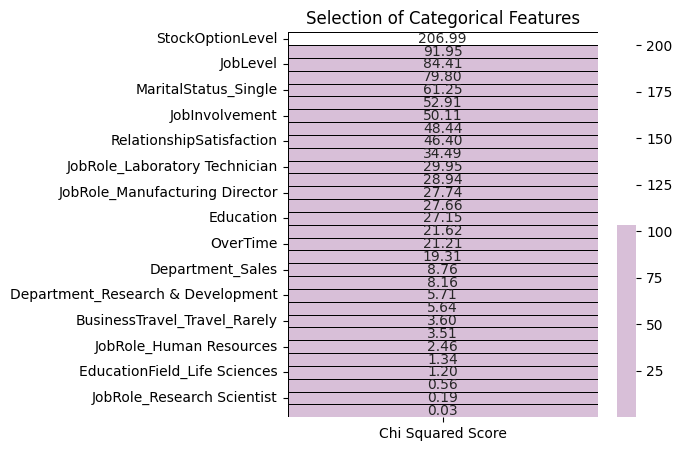

In [100]:
# features = x_train.loc[:,sve_kategoricke_new]
# target = pd.DataFrame(y_train)

# best_features = SelectKBest(score_func = chi2,k = 'all')
# fit = best_features.fit(features,target)

# featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

# plt.subplots(figsize = (5,5))
# sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
# plt.title('Selection of Categorical Features');

In [101]:
#### iz ovoga se vidi da je potrebno da se ukolone 

In [102]:
# mali_hi_kvadrat_score = featureScores[featureScores['Chi Squared Score'] < 20]


In [103]:
# mali_hi_kvadrat_score

,Chi Squared Score
Gender,19.312411
PerformanceRating,1.335016
BusinessTravel_Travel_Rarely,3.598674
Department_Research & Development,5.712424
Department_Sales,8.761403
EducationField_Life Sciences,1.195892
EducationField_Marketing,8.164007
EducationField_Medical,3.508887
EducationField_Other,0.557534
EducationField_Technical Degree,5.635789


In [104]:
# from sklearn.feature_selection import SelectKBest, f_classif

In [105]:
# features = x_train[numeričke_varijable]
# target = pd.DataFrame(y_train)

In [106]:
# best_features = SelectKBest(score_func=f_classif, k='all')
# fit = best_features.fit(features, target)

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [107]:
# feature_scores = pd.DataFrame({
#     'Feature': features.columns,
#     'ANOVA Score': fit.scores_
# })

In [108]:
# sorted_feature_scores = feature_scores.sort_values(by='ANOVA Score', ascending=False)

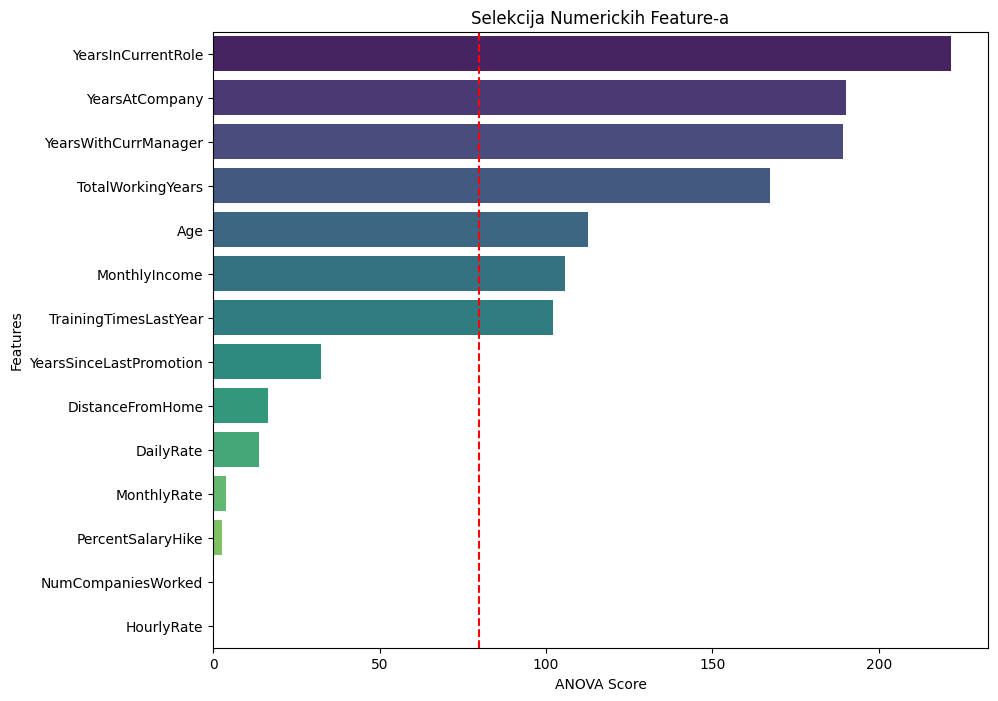

In [109]:
# plt.figure(figsize=(10, 8))
# sns.barplot(x='ANOVA Score', y='Feature', data=sorted_feature_scores, palette='viridis')
# plt.axvline(x=80, color='red', linestyle='--')
# plt.title('Selekcija Numerickih Feature-a')
# plt.xlabel('ANOVA Score')
# plt.ylabel('Features')
# plt.show()

In [110]:
#### ovde na osnovu ANOVA testa mozemo da vidimo da od numerickih varijabli bilo bi dobro da izbacimo 

# mali_anova_score = feature_scores[feature_scores['ANOVA Score'] < 80]


In [111]:
# list(mali_anova_score['Feature'].values)

['DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'YearsSinceLastPromotion',
 'YearsSinceLastPromotion']

In [112]:
# mali_anova_score_kolone=list(mali_anova_score['Feature'].values)

In [113]:
# mali_hi_kvadrat_score.columns

Index(['Chi Squared Score'], dtype='object')

In [114]:
# mali_hi_kvadrat_score_kolone=list(mali_hi_kvadrat_score.index.values)

In [115]:
# mali_hi_kvadrat_score_kolone

['Gender',
 'PerformanceRating',
 'BusinessTravel_Travel_Rarely',
 'Department_Research & Development',
 'Department_Sales',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'JobRole_Human Resources',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive']

In [116]:
# kolone_za_brisanje=mali_anova_score_kolone+mali_hi_kvadrat_score_kolone

In [117]:
# kolone_za_brisanje

['DailyRate',
 'DistanceFromHome',
 'HourlyRate',
 'MonthlyRate',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'YearsSinceLastPromotion',
 'YearsSinceLastPromotion',
 'Gender',
 'PerformanceRating',
 'BusinessTravel_Travel_Rarely',
 'Department_Research & Development',
 'Department_Sales',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'JobRole_Human Resources',
 'JobRole_Research Scientist',
 'JobRole_Sales Executive']

In [118]:
# len(kolone_za_brisanje)

21

In [119]:
# x_train = x_train.drop(columns = kolone_za_brisanje)

# x_test = x_test.drop(columns = kolone_za_brisanje)

In [120]:
x_train

,Age,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,...,YearsInCurrentRole,YearsWithCurrManager,BusinessTravel_Travel_Frequently,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
0,28,4,1,3,2,4,4908,0,2,0,...,2,2,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.000000
1,20,3,3,4,1,4,2678,0,4,0,...,1,2,0.000000,0.000000,0.0,0.0,0.0,1.000000,0.000000,1.000000
2,27,3,4,2,1,3,2539,0,3,1,...,2,2,0.000000,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.000000
3,41,2,1,2,1,1,2107,0,1,1,...,0,0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
4,46,4,1,3,2,4,5772,1,3,0,...,6,8,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1930,38,3,1,3,1,3,5233,1,1,0,...,2,3,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.205912,0.794088
1931,21,1,3,2,1,3,2630,0,1,0,...,0,0,0.120848,0.000000,0.0,0.0,0.0,0.120848,0.000000,1.000000
1932,26,3,2,2,1,3,2735,1,2,0,...,6,0,0.987345,0.012655,0.0,0.0,0.0,0.000000,0.000000,0.012655
1933,19,2,2,2,1,2,1472,0,1,0,...,0,0,0.371653,0.628347,0.0,0.0,0.0,0.371653,0.000000,1.000000


In [121]:
x_train.columns

Index(['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'OverTime',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Frequently', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobRole_Sales Representative',
       'MaritalStatus_Married', 'MaritalStatus_Single'],
      dtype='object')

In [122]:
############### NACIN skaliranja varijabli prvo cemo uraditi normalizaciju

In [100]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [101]:
min_max_scaler = MinMaxScaler()

In [125]:
#standard_scaler = StandardScaler()

In [102]:
kolone_za_normalizaciju = ['MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']

In [104]:
kolone_za_normalizaciju = [col for col in kolone_za_normalizaciju if col in retained_columns]

In [127]:
#kolone_za_standardizaciju = ['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'OverTime', 'RelationshipSatisfaction', 'StockOptionLevel', 'TrainingTimesLastYear', 'WorkLifeBalance']

In [105]:
standard_scalers = {}
min_max_scalers = {}

In [129]:
# for col in kolone_za_standardizaciju:
#     x_train[col] = standard_scaler.fit_transform(x_train[[col]])
#     x_test[col] = standard_scaler.transform(x_test[[col]])
#     standard_scalers[col] = standard_scaler

In [111]:
retained_columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'Department_Research & Development', 'EducationField_Life Sciences',
       'MaritalStatus_Married', 'MaritalStatus_Single'],
      dtype='object')

In [112]:
x_train_var

array([[2.80000000e+01, 8.21000000e+02, 5.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [2.00000000e+01, 6.54000000e+02, 2.10000000e+01, ...,
        0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [2.70000000e+01, 1.99000000e+02, 6.00000000e+00, ...,
        1.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       ...,
       [2.90000000e+01, 1.26300000e+03, 1.20000000e+01, ...,
        6.71106574e-01, 1.00000000e+00, 0.00000000e+00],
       [3.20000000e+01, 7.18000000e+02, 1.20000000e+01, ...,
        0.00000000e+00, 4.59631355e-01, 0.00000000e+00],
       [4.80000000e+01, 6.08000000e+02, 2.70000000e+01, ...,
        1.85451247e-01, 0.00000000e+00, 1.85451247e-01]])

In [113]:
x_train_var = pd.DataFrame(data=x_train_var, columns=retained_columns)


In [115]:
x_test_var = pd.DataFrame(data=x_test_var, columns=retained_columns)


In [116]:
x_train=x_train_var
x_test=x_test_var

In [117]:
for col in kolone_za_normalizaciju:
    x_train[col] = min_max_scaler.fit_transform(x_train[[col]])
    x_test[col] = min_max_scaler.transform(x_test[[col]])
    min_max_scalers[col] = min_max_scaler

### MODELIRANJE

In [119]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc



In [132]:
##### Posto ce se koristiti mnogi modeli kako se kod ne bi preklapao postojace funkcije koje rade 
# izggradnju modela prikaz kros validacijskog scora i prikaz evaluacionih metrika

In [120]:
import matplotlib.pyplot as plt

In [121]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve, precision_score, recall_score, f1_score, precision_recall_curve

In [122]:
boje_za_grafikone= ['#8A2BE2','#D02090']

#### Modelovanje bez hiperparametrizacije

In [123]:
def prikazivanje_roc_auc_krive(model, x_test, y_test, y_pred_proba):
    #y_prob = model.predict_proba(x_test)[:,1]

    FPR,TPR, thresholds = roc_curve(y_test, y_pred_proba)

    roc_auc = auc(FPR,TPR)
    plt.figure()
    plt.plot(FPR, TPR, color='purple', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='violet', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC kriva')
    plt.legend(loc="lower right")
    plt.show()

In [124]:
def krosvalidacija_i_prikaz_roc_auc_krive(model, x_train, y_train, x_test, y_test, y_pred, y_pred_proba):
    ##### Krosvalidacija i pracenje krosvalidacionog score-a
    cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats=3, random_state=1)
    kros_validacioni_score=cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()
    print("Krosvalidacioni scopre: ",'{0:.2%}'.format(cross_val_score(model,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test,y_pred)))

    ############### SADA SE PRINTA ROC_AUC KRIVA
    prikazivanje_roc_auc_krive (model, x_test, y_test, y_pred_proba)
    return kros_validacioni_score

In [125]:
def evaluacija_modela_metrike(ime_modela,y_test, y_pred, y_pred_prob):

    print("#################################")
    accuracy=accuracy_score(y_test, y_pred)
    print(f"Accuracy (Tačnost): {accuracy_score(y_test, y_pred)}")
    print("#################################")
    precision_= precision_score(y_test, y_pred)
    print(f"Precision (Preciznost): {precision_score(y_test, y_pred)}")
    print("#################################")
    recall_ = recall_score(y_test, y_pred)
    print(f"Recall(odziv): {recall_score(y_test, y_pred)}")
    print("###############################")
    f1_score_=f1_score(y_test, y_pred)
    print(f"F1 Score: {f1_score(y_test, y_pred)}")
    roc_auc_score_=roc_auc_score(y_test, y_pred_prob)
    print(f"ROC AUC: {roc_auc_score(y_test, y_pred_prob)}")
    print(f"Confusion Matrix (matrica konfuzije):\n{confusion_matrix(y_test, y_pred)}")
    print(f"Classification Report (klasifikacijski izvestaj):\n{classification_report(y_test, y_pred)}\n")

    ###### printing the confusion matrix
    plt.figure(figsize=(4, 4))
    matrica_konfuzije= confusion_matrix(y_test, y_pred)
    falseNegativi=matrica_konfuzije[1,0]
    ## IZMENJENA MATRICA RADI INTUITIVNIJEG PRIKAZA
    konvertovana_matrica = np.fliplr(np.flipud(matrica_konfuzije))
    
    sns.heatmap(konvertovana_matrica, annot=True, fmt='d', cmap=boje_za_grafikone, xticklabels=['Attrition', 'No Attrition'], yticklabels=['Attrition', 'No Attrition'])
    plt.xlabel('Predvidjena')
    plt.ylabel('Stvarna')
    plt.title(f'Matrica konfuzuje za model {ime_modela}')
    plt.show()
    
    ##### izvestaj klasifikacije 
    print(classification_report(y_test,y_pred))

    precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, label=f' Grafik za model{ime_modela}',  color='violet')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall kriva za  {ime_modela}')
    plt.legend()
    plt.show()
    return accuracy, precision_, recall_,f1_score_,roc_auc_score_,falseNegativi

    

In [126]:
def prikaz_znacajnosti_atributa(model, model_name, feature_names):
    if hasattr(model, 'feature_importances_'):
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[0], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        ###############################
        top_tri_aributa = np.array(feature_names)[sorted_idx][:3]
        return top_tri_aributa.tolist()
    elif hasattr(model, 'coef_'):
        importance = model.coef_[0]
        sorted_idx = np.argsort(importance)
        plt.figure(figsize=(10, 8))
        plt.barh(range(len(sorted_idx)), importance[sorted_idx], color=boje_za_grafikone[1], align='center')
        plt.yticks(range(len(sorted_idx)), np.array(feature_names)[sorted_idx])
        plt.xlabel('Znacajni atributi')
        plt.title(f'Znacajni atributi za {model_name}')
        plt.show()
        top_tri_aributa = np.array(feature_names)[sorted_idx][:3]
        return top_tri_aributa.tolist()
    else:
        print("Model nema podržanu značajnost attributa")
        return []

In [127]:
#########################
REZULTATI_TABELA = pd.DataFrame(columns=["Ime modela","Accuracy", "Precision", "Recall", "F1-score", "ROC_AUC_SCORE", "KrosvalidacioniScore", "FALSE NEGATIVI", "HIPERPARAMETRIZACIJA", "NAJBOLJI PARAMETRI","NAJZNACAJNIJI ATRIBUTI"])
#REZULTATI_TABELA = {}
feature_names = x_train.columns

In [130]:
import seaborn as sns

#### Model logisticke regresije

In [131]:
from sklearn.linear_model import LogisticRegression

c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

########### MODEL LOGISTICKE REGRESIJE ###########


c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

Krosvalidacioni scopre:  77.02%
ROC_AUC Score :  60.55%


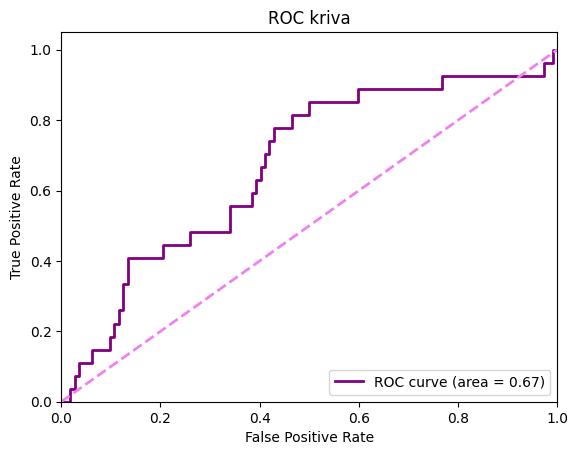

#################################
Accuracy (Tačnost): 0.7266187050359713
#################################
Precision (Preciznost): 0.3333333333333333
#################################
Recall(odziv): 0.4074074074074074
###############################
F1 Score: 0.36666666666666664
ROC AUC: 0.6719576719576719
Confusion Matrix (matrica konfuzije):
[[90 22]
 [16 11]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.80      0.83       112
           1       0.33      0.41      0.37        27

    accuracy                           0.73       139
   macro avg       0.59      0.61      0.60       139
weighted avg       0.75      0.73      0.74       139




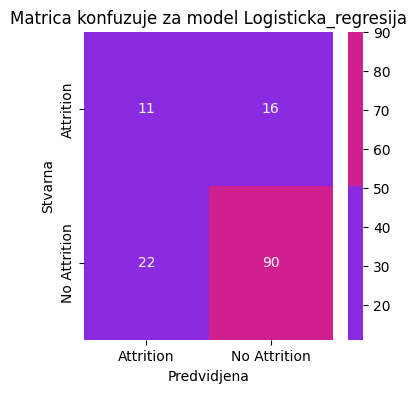

              precision    recall  f1-score   support

           0       0.85      0.80      0.83       112
           1       0.33      0.41      0.37        27

    accuracy                           0.73       139
   macro avg       0.59      0.61      0.60       139
weighted avg       0.75      0.73      0.74       139



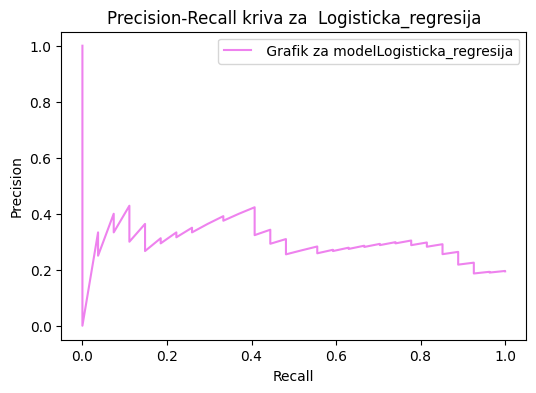

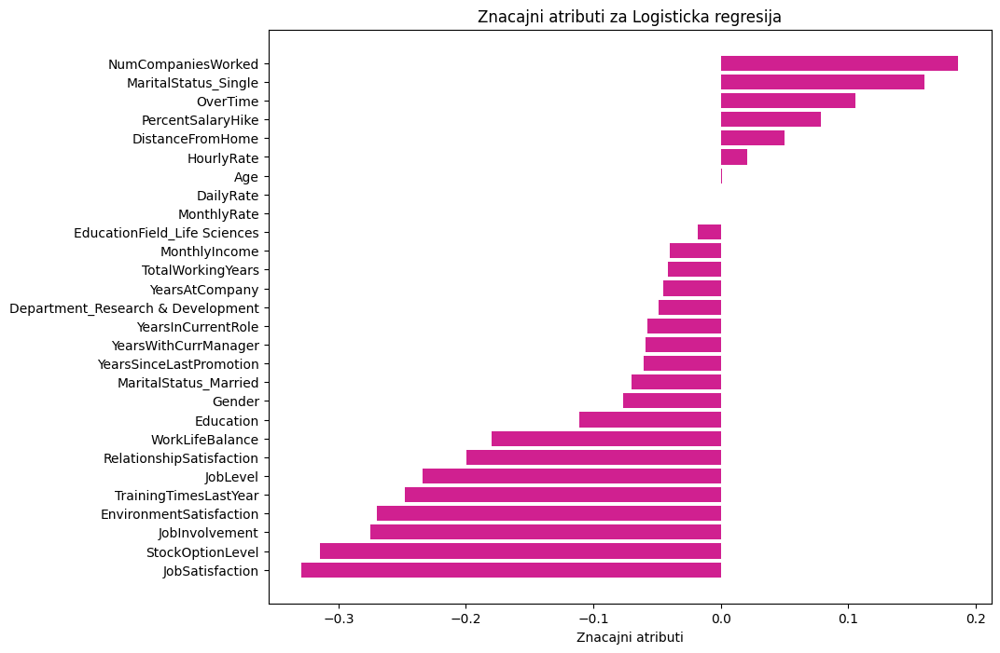

In [132]:
model_lr = LogisticRegression()
model_lr.fit(x_train, y_train)
y_pred_lr = model_lr.predict(x_test)
y_pred_prob_lr = model_lr.predict_proba(x_test)[:, 1]
print("########### MODEL LOGISTICKE REGRESIJE ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lr, x_train,y_train,x_test, y_test,y_pred_lr, y_pred_prob_lr)
accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Logisticka_regresija", y_test,y_pred_lr, y_pred_prob_lr)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lr, "Logisticka regresija", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Logisticka regresija",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [133]:
from sklearn.tree import DecisionTreeClassifier

########### MODEL Drvo odlucivanja ###########
Krosvalidacioni scopre:  82.45%
ROC_AUC Score :  53.59%


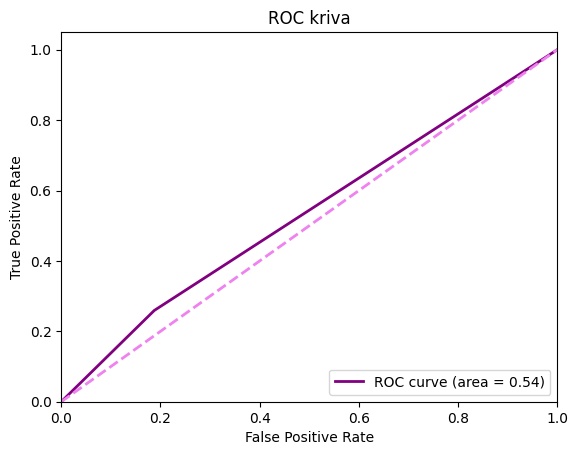

#################################
Accuracy (Tačnost): 0.7050359712230215
#################################
Precision (Preciznost): 0.25
#################################
Recall(odziv): 0.25925925925925924
###############################
F1 Score: 0.2545454545454545
ROC AUC: 0.5358796296296297
Confusion Matrix (matrica konfuzije):
[[91 21]
 [20  7]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.82      0.81      0.82       112
           1       0.25      0.26      0.25        27

    accuracy                           0.71       139
   macro avg       0.53      0.54      0.54       139
weighted avg       0.71      0.71      0.71       139




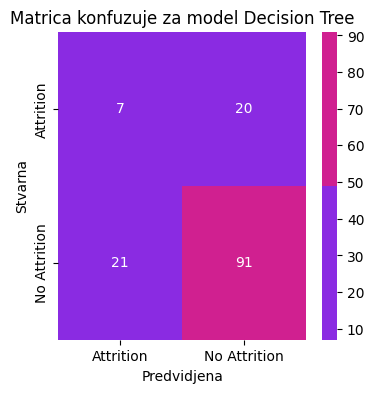

              precision    recall  f1-score   support

           0       0.82      0.81      0.82       112
           1       0.25      0.26      0.25        27

    accuracy                           0.71       139
   macro avg       0.53      0.54      0.54       139
weighted avg       0.71      0.71      0.71       139



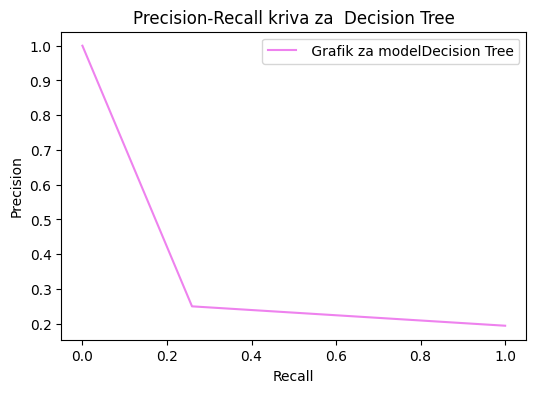

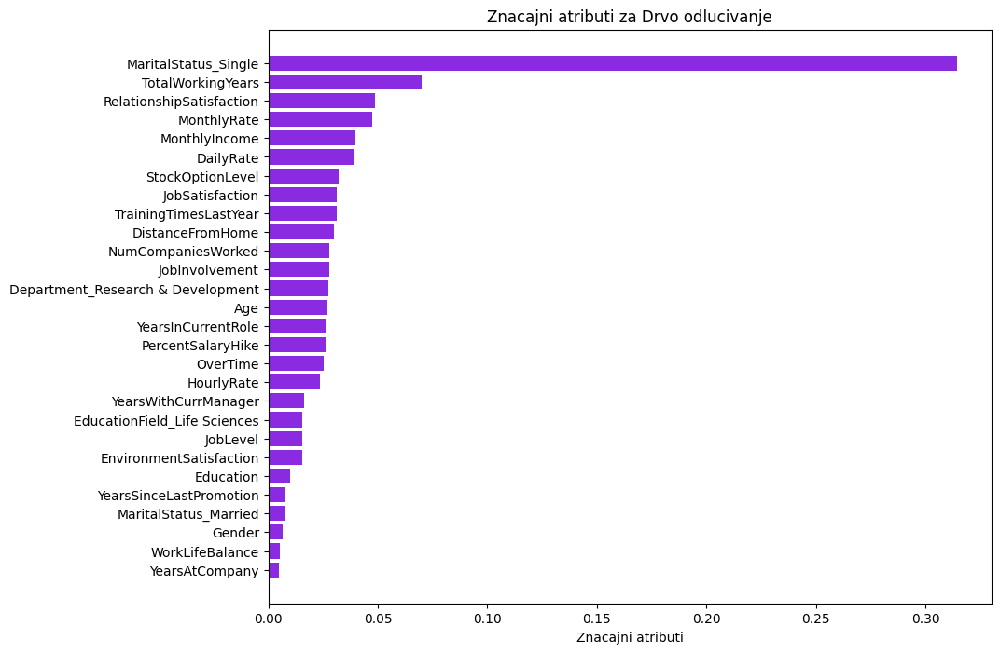

In [134]:
model_dt = DecisionTreeClassifier()
model_dt.fit(x_train, y_train)
y_pred_dt = model_dt.predict(x_test)
y_pred_prob_dt = model_dt.predict_proba(x_test)[:, 1]

print("########### MODEL Drvo odlucivanja ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_dt, x_train,y_train,x_test, y_test,y_pred_dt, y_pred_prob_dt)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Decision Tree", y_test,y_pred_dt, y_pred_prob_dt)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_dt, "Drvo odlucivanje", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Drvo odlucivanja",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [135]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier


########### MODEL Random Forest###########
Krosvalidacioni scopre:  96.84%
ROC_AUC Score :  55.62%


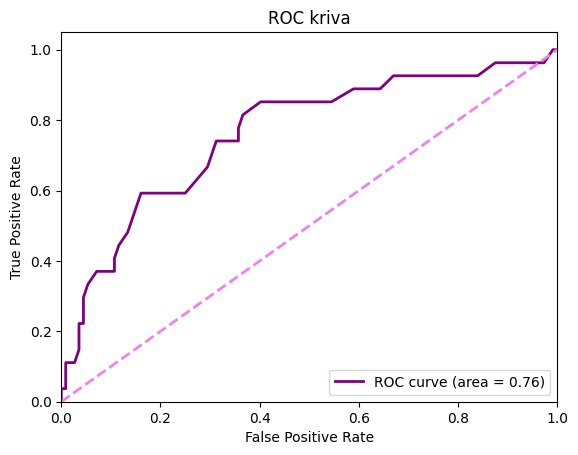

#################################
Accuracy (Tačnost): 0.8057553956834532
#################################
Precision (Preciznost): 0.5
#################################
Recall(odziv): 0.14814814814814814
###############################
F1 Score: 0.22857142857142856
ROC AUC: 0.7620701058201058
Confusion Matrix (matrica konfuzije):
[[108   4]
 [ 23   4]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.82      0.96      0.89       112
           1       0.50      0.15      0.23        27

    accuracy                           0.81       139
   macro avg       0.66      0.56      0.56       139
weighted avg       0.76      0.81      0.76       139




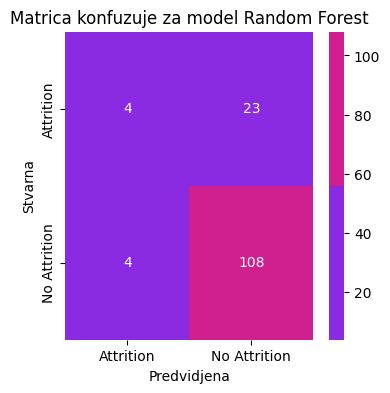

              precision    recall  f1-score   support

           0       0.82      0.96      0.89       112
           1       0.50      0.15      0.23        27

    accuracy                           0.81       139
   macro avg       0.66      0.56      0.56       139
weighted avg       0.76      0.81      0.76       139



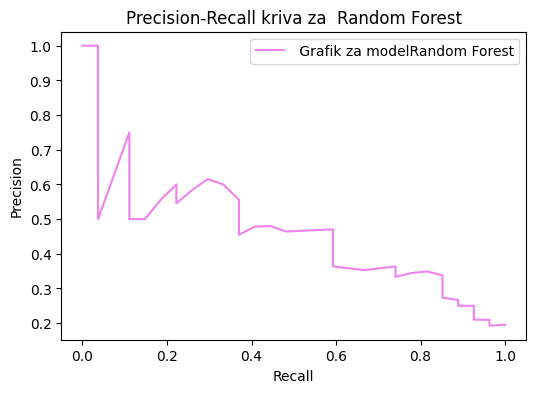

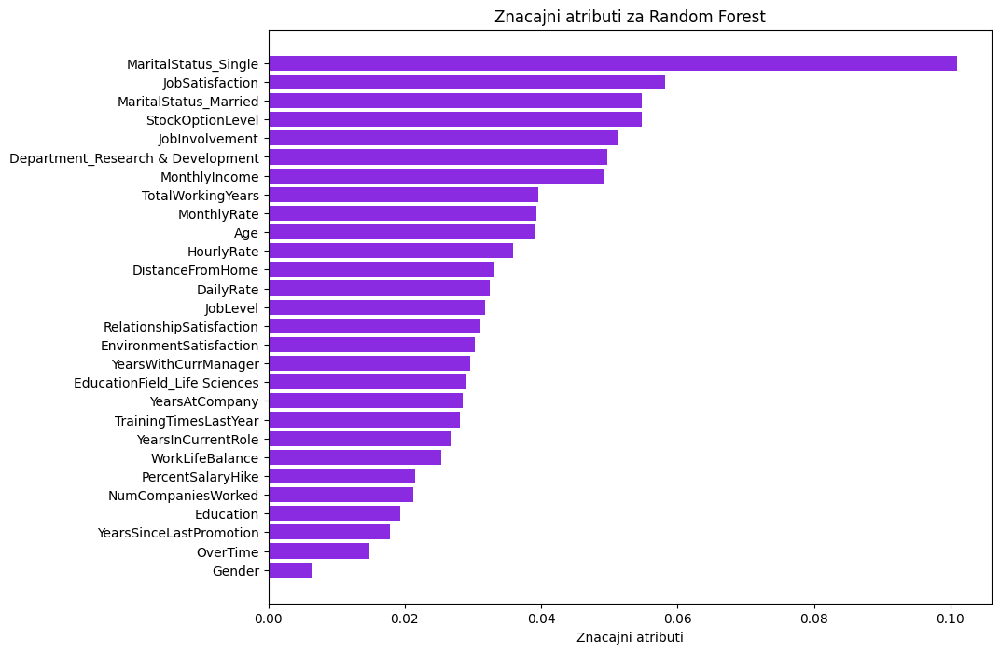

In [136]:
model_rf = RandomForestClassifier()
model_rf.fit(x_train, y_train)
y_pred_rf = model_rf.predict(x_test)
y_pred_prob_rf = model_rf.predict_proba(x_test)[:, 1]

print("########### MODEL Random Forest###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_rf, x_train,y_train,x_test, y_test,y_pred_rf, y_pred_prob_rf)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Random Forest", y_test,y_pred_rf, y_pred_prob_rf)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_rf, "Random Forest", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Gradient Boosting Classifier ###########
Krosvalidacioni scopre:  96.06%
ROC_AUC Score :  65.84%


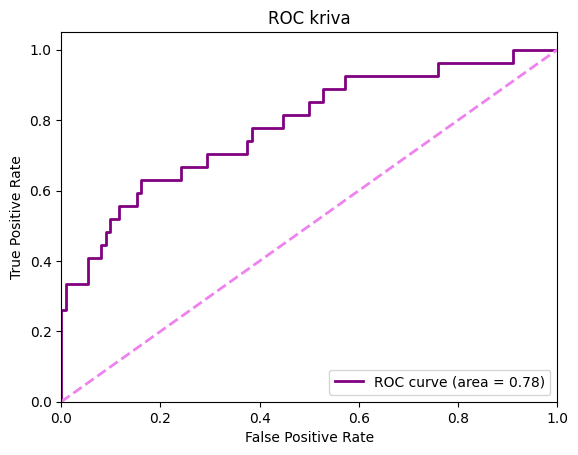

#################################
Accuracy (Tačnost): 0.8345323741007195
#################################
Precision (Preciznost): 0.625
#################################
Recall(odziv): 0.37037037037037035
###############################
F1 Score: 0.4651162790697674
ROC AUC: 0.7840608465608466
Confusion Matrix (matrica konfuzije):
[[106   6]
 [ 17  10]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.86      0.95      0.90       112
           1       0.62      0.37      0.47        27

    accuracy                           0.83       139
   macro avg       0.74      0.66      0.68       139
weighted avg       0.82      0.83      0.82       139




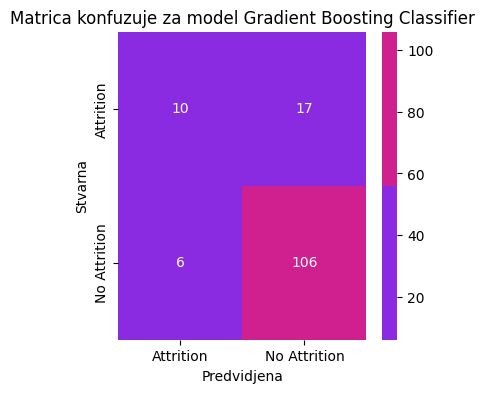

              precision    recall  f1-score   support

           0       0.86      0.95      0.90       112
           1       0.62      0.37      0.47        27

    accuracy                           0.83       139
   macro avg       0.74      0.66      0.68       139
weighted avg       0.82      0.83      0.82       139



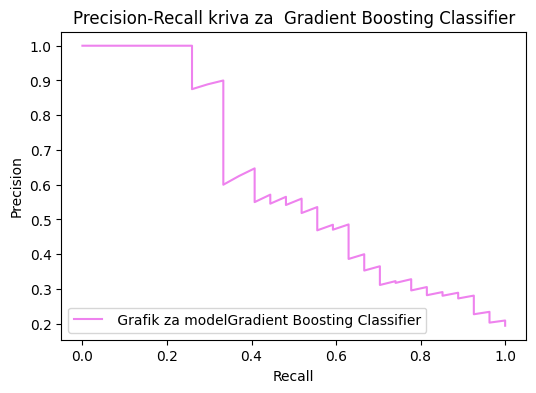

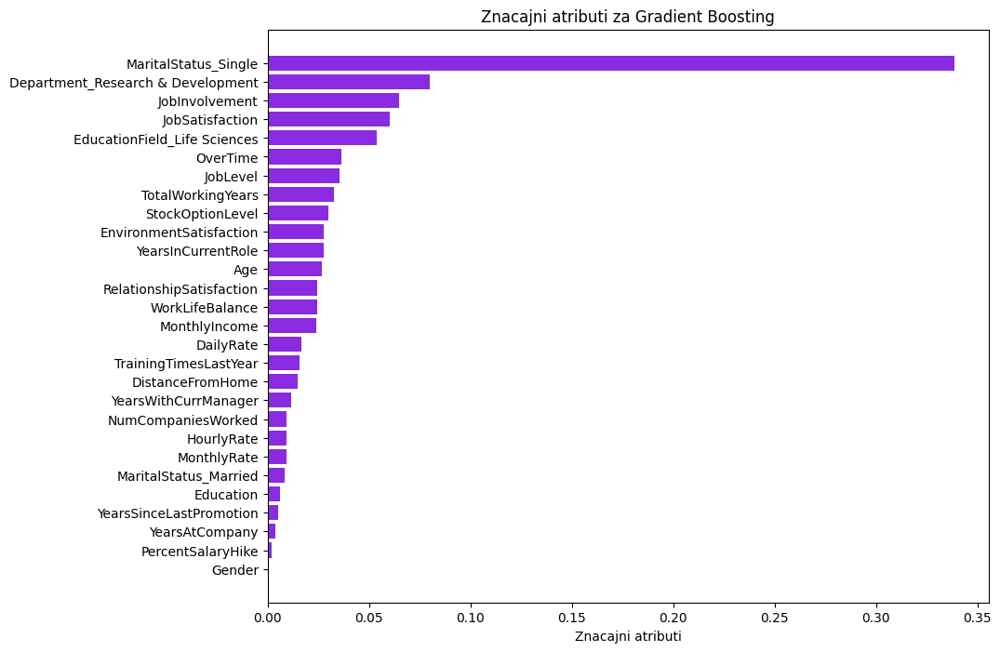

In [137]:
model_gb = GradientBoostingClassifier()
model_gb.fit(x_train, y_train)
y_pred_gb = model_gb.predict(x_test)
y_pred_prob_gb = model_gb.predict_proba(x_test)[:, 1]

print("########### MODEL Gradient Boosting Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gb, x_train,y_train,x_test, y_test,y_pred_gb, y_pred_prob_gb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Gradient Boosting Classifier", y_test,y_pred_gb, y_pred_prob_gb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gb, "Gradient Boosting", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Ada Boost Classifier ###########
Krosvalidacioni scopre:  95.18%
ROC_AUC Score :  69.10%


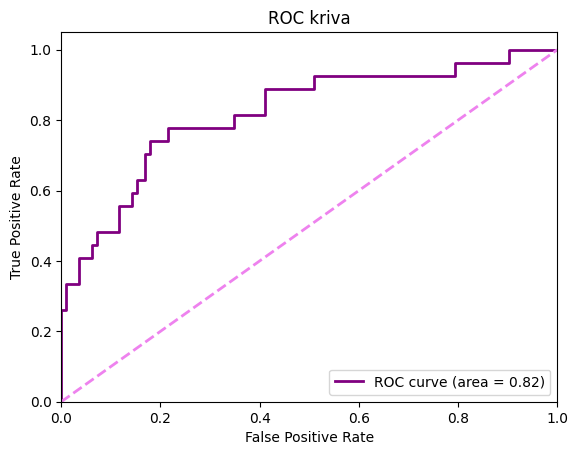

#################################
Accuracy (Tačnost): 0.841726618705036
#################################
Precision (Preciznost): 0.631578947368421
#################################
Recall(odziv): 0.4444444444444444
###############################
F1 Score: 0.5217391304347826
ROC AUC: 0.8201058201058201
Confusion Matrix (matrica konfuzije):
[[105   7]
 [ 15  12]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       112
           1       0.63      0.44      0.52        27

    accuracy                           0.84       139
   macro avg       0.75      0.69      0.71       139
weighted avg       0.83      0.84      0.83       139




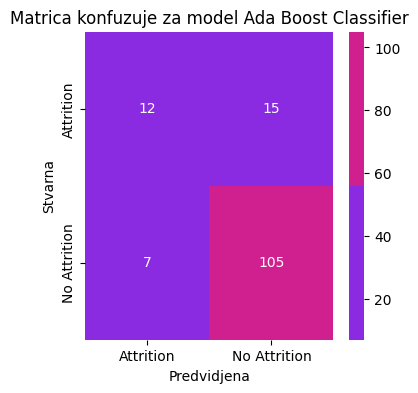

              precision    recall  f1-score   support

           0       0.88      0.94      0.91       112
           1       0.63      0.44      0.52        27

    accuracy                           0.84       139
   macro avg       0.75      0.69      0.71       139
weighted avg       0.83      0.84      0.83       139



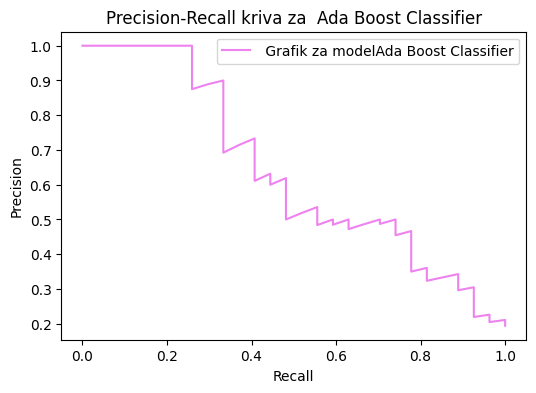

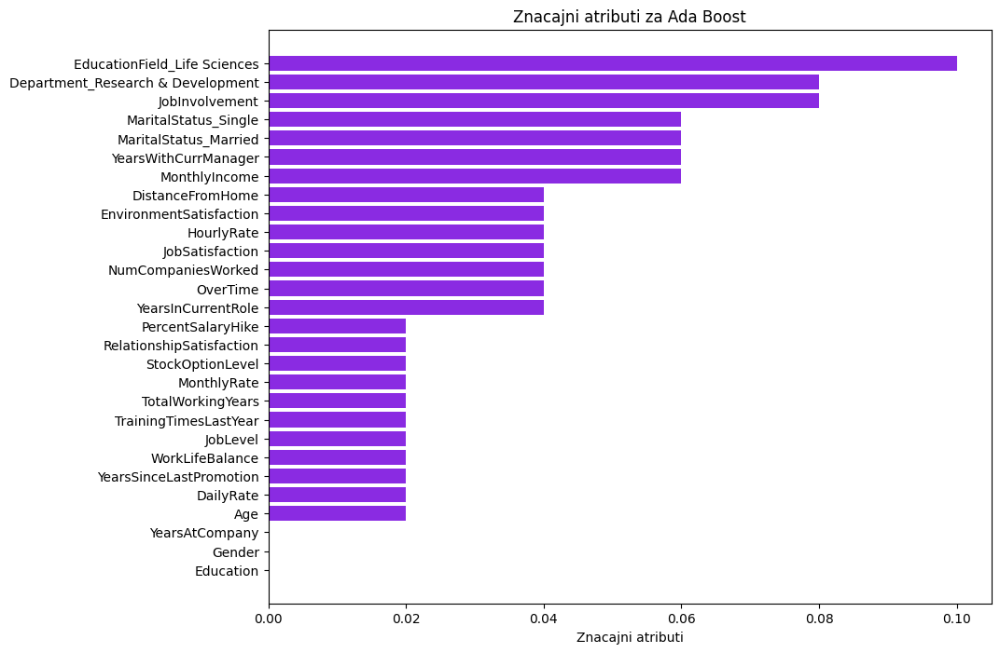

In [138]:
model_ab = AdaBoostClassifier()
model_ab.fit(x_train, y_train)
y_pred_ab = model_ab.predict(x_test)
y_pred_prob_ab = model_ab.predict_proba(x_test)[:, 1]

print("########### MODEL Ada Boost Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_ab, x_train,y_train,x_test, y_test,y_pred_ab, y_pred_prob_ab)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Ada Boost Classifier", y_test,y_pred_ab, y_pred_prob_ab)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_ab, "Ada Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

########### MODEL Bagging Classifier ###########
Krosvalidacioni scopre:  94.89%
ROC_AUC Score :  57.47%


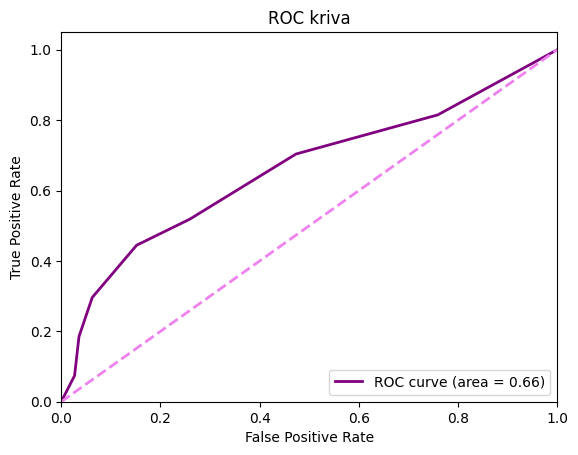

#################################
Accuracy (Tačnost): 0.8129496402877698
#################################
Precision (Preciznost): 0.5555555555555556
#################################
Recall(odziv): 0.18518518518518517
###############################
F1 Score: 0.2777777777777778
ROC AUC: 0.6598875661375662
Confusion Matrix (matrica konfuzije):
[[108   4]
 [ 22   5]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.83      0.96      0.89       112
           1       0.56      0.19      0.28        27

    accuracy                           0.81       139
   macro avg       0.69      0.57      0.59       139
weighted avg       0.78      0.81      0.77       139




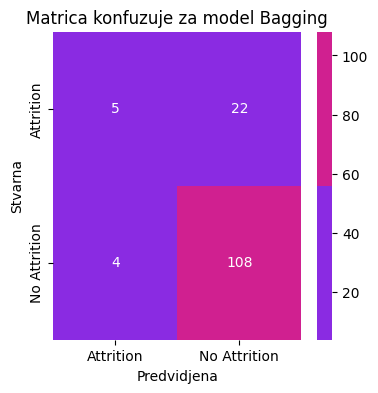

              precision    recall  f1-score   support

           0       0.83      0.96      0.89       112
           1       0.56      0.19      0.28        27

    accuracy                           0.81       139
   macro avg       0.69      0.57      0.59       139
weighted avg       0.78      0.81      0.77       139



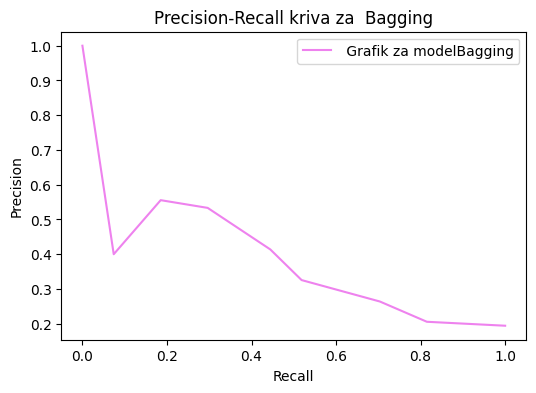

Model nema podržanu značajnost attributa


In [139]:
model_bg = BaggingClassifier()
model_bg.fit(x_train, y_train)
y_pred_bg = model_bg.predict(x_test)
y_pred_prob_bg = model_bg.predict_proba(x_test)[:, 1]

print("########### MODEL Bagging Classifier ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_bg, x_train,y_train,x_test, y_test,y_pred_bg, y_pred_prob_bg)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Bagging", y_test,y_pred_bg, y_pred_prob_bg)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_bg, "Bagging Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [140]:
import xgboost as xgb
import lightgbm as lgb
import catboost as cb

########### MODEL XGB Classifier###########
Krosvalidacioni scopre:  96.85%
ROC_AUC Score :  63.92%


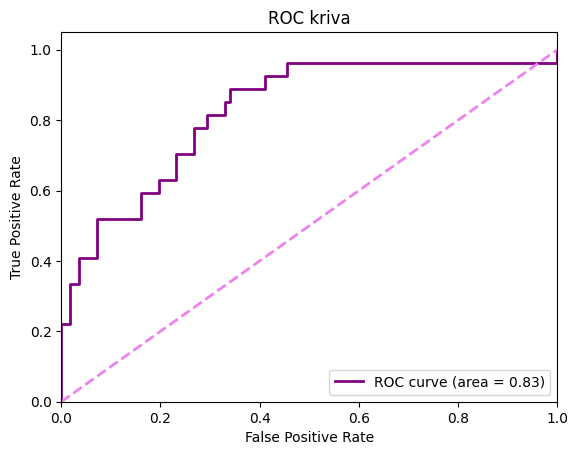

#################################
Accuracy (Tačnost): 0.8489208633093526
#################################
Precision (Preciznost): 0.8
#################################
Recall(odziv): 0.2962962962962963
###############################
F1 Score: 0.43243243243243246
ROC AUC: 0.8263888888888888
Confusion Matrix (matrica konfuzije):
[[110   2]
 [ 19   8]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.98      0.91       112
           1       0.80      0.30      0.43        27

    accuracy                           0.85       139
   macro avg       0.83      0.64      0.67       139
weighted avg       0.84      0.85      0.82       139




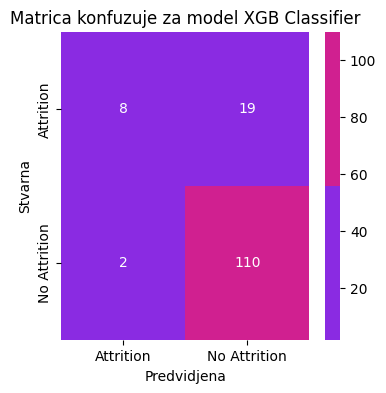

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       112
           1       0.80      0.30      0.43        27

    accuracy                           0.85       139
   macro avg       0.83      0.64      0.67       139
weighted avg       0.84      0.85      0.82       139



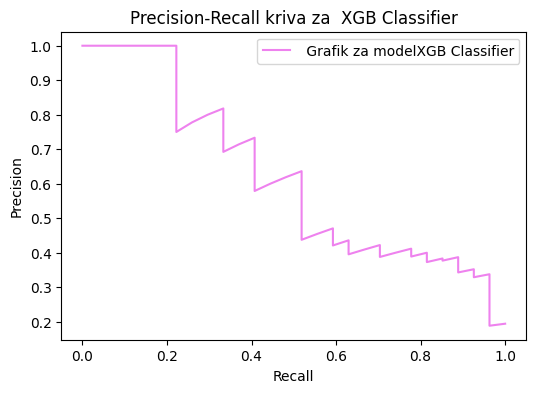

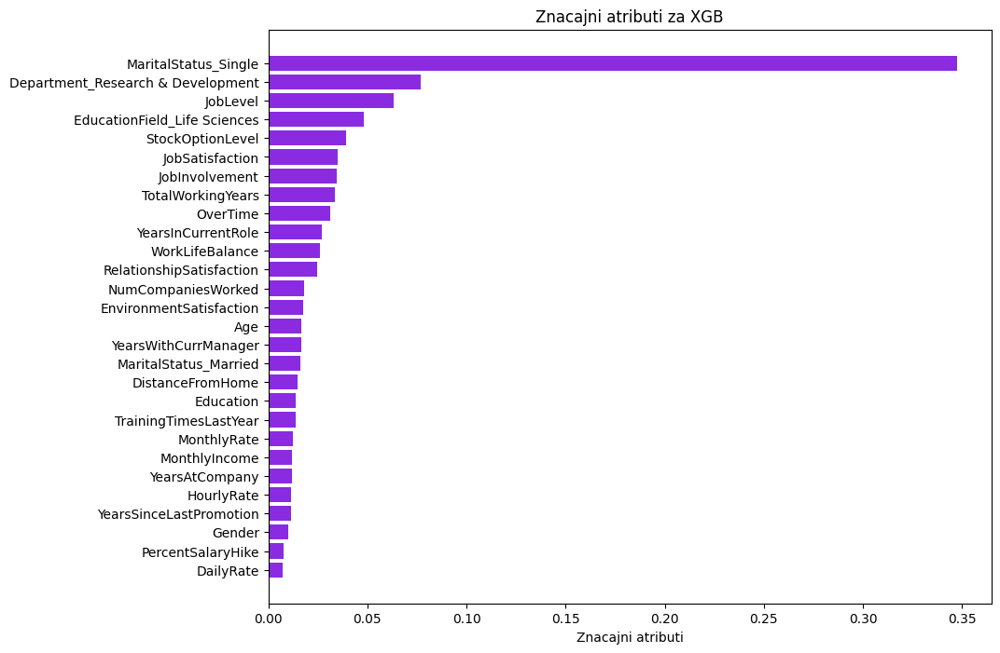

In [141]:
model_xgb = xgb.XGBClassifier()
model_xgb.fit(x_train, y_train)
y_pred_xgb = model_xgb.predict(x_test)
y_pred_prob_xgb = model_xgb.predict_proba(x_test)[:, 1]

print("########### MODEL XGB Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_xgb, x_train,y_train,x_test, y_test,y_pred_xgb, y_pred_prob_xgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("XGB Classifier", y_test,y_pred_xgb, y_pred_prob_xgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_xgb, "XGB", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "XGB",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 889, number of negative: 1046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2111
[LightGBM] [Info] Number of data points in the train set: 1935, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459432 -> initscore=-0.162631
[LightGBM] [Info] Start training from score -0.162631
########### MODEL LGBM Classifier###########
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 800, number of negative: 941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [

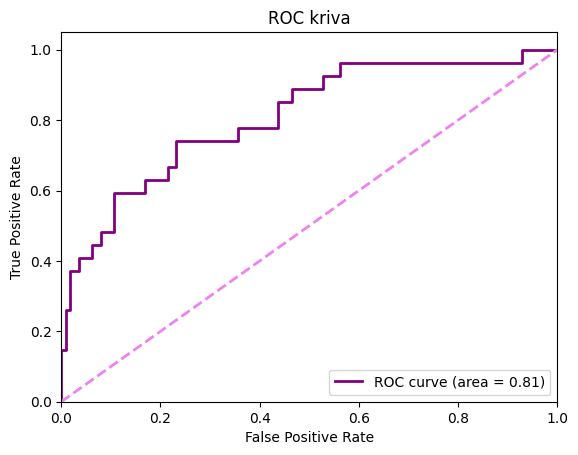

#################################
Accuracy (Tačnost): 0.8633093525179856
#################################
Precision (Preciznost): 0.8333333333333334
#################################
Recall(odziv): 0.37037037037037035
###############################
F1 Score: 0.5128205128205128
ROC AUC: 0.8095238095238094
Confusion Matrix (matrica konfuzije):
[[110   2]
 [ 17  10]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       112
           1       0.83      0.37      0.51        27

    accuracy                           0.86       139
   macro avg       0.85      0.68      0.72       139
weighted avg       0.86      0.86      0.84       139




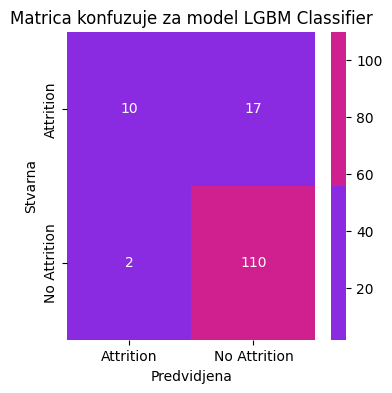

              precision    recall  f1-score   support

           0       0.87      0.98      0.92       112
           1       0.83      0.37      0.51        27

    accuracy                           0.86       139
   macro avg       0.85      0.68      0.72       139
weighted avg       0.86      0.86      0.84       139



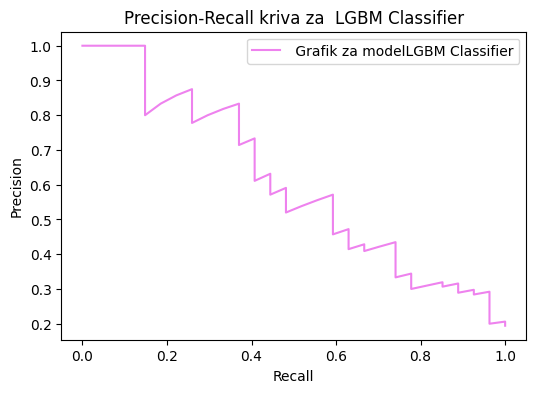

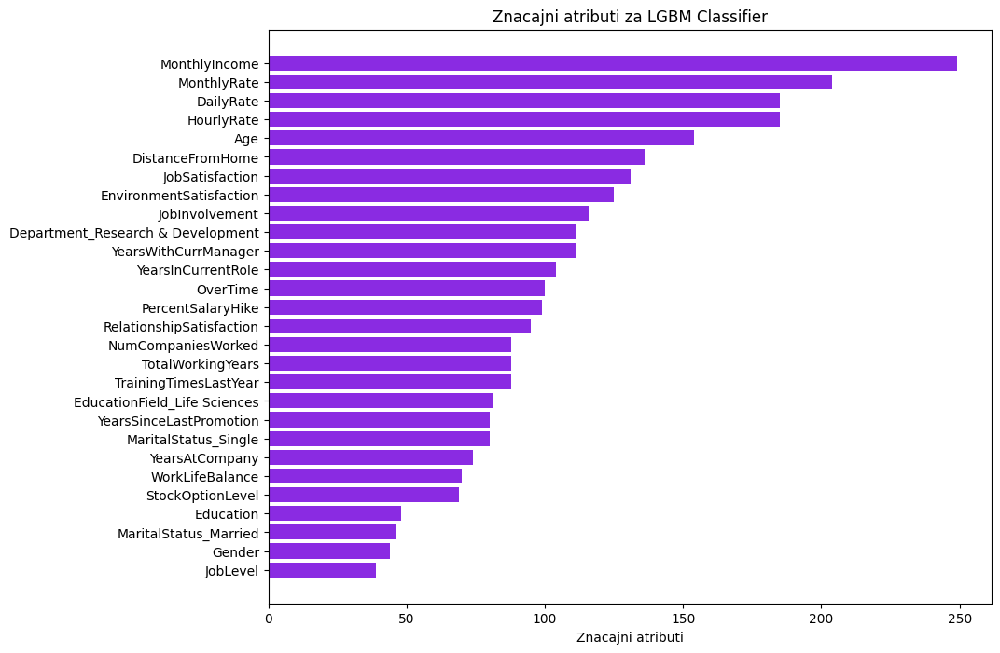

In [142]:
model_lgb = lgb.LGBMClassifier()
model_lgb.fit(x_train, y_train)
y_pred_lgb = model_lgb.predict(x_test)
y_pred_prob_lgb = model_lgb.predict_proba(x_test)[:, 1]

print("########### MODEL LGBM Classifier###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_lgb, x_train,y_train,x_test, y_test,y_pred_lgb, y_pred_prob_lgb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("LGBM Classifier", y_test,y_pred_lgb, y_pred_prob_lgb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_lgb, "LGBM Classifier", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "LGBM Classifier",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Learning rate set to 0.013657
0:	learn: 0.6832049	total: 139ms	remaining: 2m 18s
1:	learn: 0.6732572	total: 142ms	remaining: 1m 10s
2:	learn: 0.6640943	total: 147ms	remaining: 48.8s
3:	learn: 0.6553986	total: 152ms	remaining: 37.8s
4:	learn: 0.6456497	total: 159ms	remaining: 31.6s
5:	learn: 0.6363340	total: 164ms	remaining: 27.1s
6:	learn: 0.6265613	total: 168ms	remaining: 23.9s
7:	learn: 0.6181561	total: 173ms	remaining: 21.4s
8:	learn: 0.6101817	total: 181ms	remaining: 20s
9:	learn: 0.6042524	total: 186ms	remaining: 18.4s
10:	learn: 0.5956082	total: 190ms	remaining: 17s
11:	learn: 0.5890602	total: 196ms	remaining: 16.1s
12:	learn: 0.5834097	total: 200ms	remaining: 15.2s
13:	learn: 0.5755472	total: 204ms	remaining: 14.4s
14:	learn: 0.5678236	total: 210ms	remaining: 13.8s
15:	learn: 0.5612887	total: 216ms	remaining: 13.3s
16:	learn: 0.5550839	total: 221ms	remaining: 12.8s
17:	learn: 0.5494350	total: 226ms	remaining: 12.3s
18:	learn: 0.5433261	total: 231ms	remaining: 11.9s
19:	learn: 0.

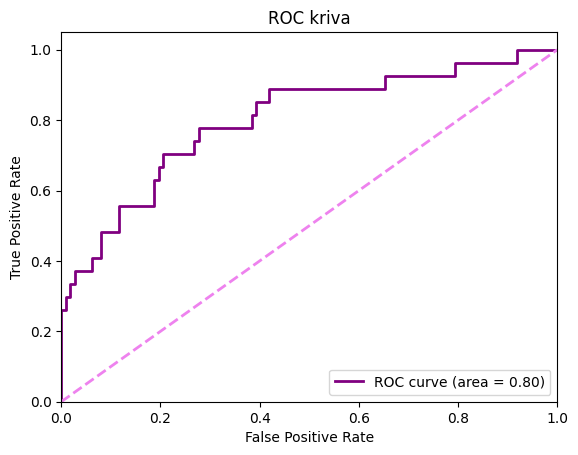

#################################
Accuracy (Tačnost): 0.8561151079136691
#################################
Precision (Preciznost): 0.8181818181818182
#################################
Recall(odziv): 0.3333333333333333
###############################
F1 Score: 0.4736842105263157
ROC AUC: 0.8002645502645502
Confusion Matrix (matrica konfuzije):
[[110   2]
 [ 18   9]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.86      0.98      0.92       112
           1       0.82      0.33      0.47        27

    accuracy                           0.86       139
   macro avg       0.84      0.66      0.70       139
weighted avg       0.85      0.86      0.83       139




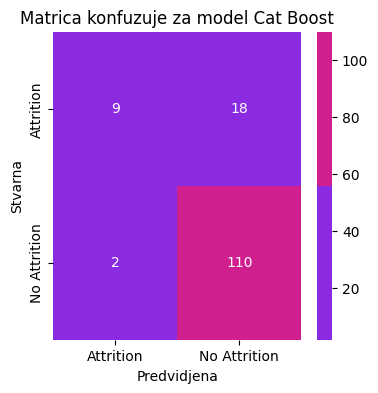

              precision    recall  f1-score   support

           0       0.86      0.98      0.92       112
           1       0.82      0.33      0.47        27

    accuracy                           0.86       139
   macro avg       0.84      0.66      0.70       139
weighted avg       0.85      0.86      0.83       139



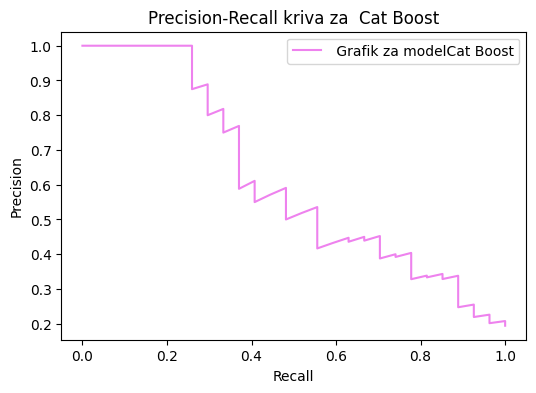

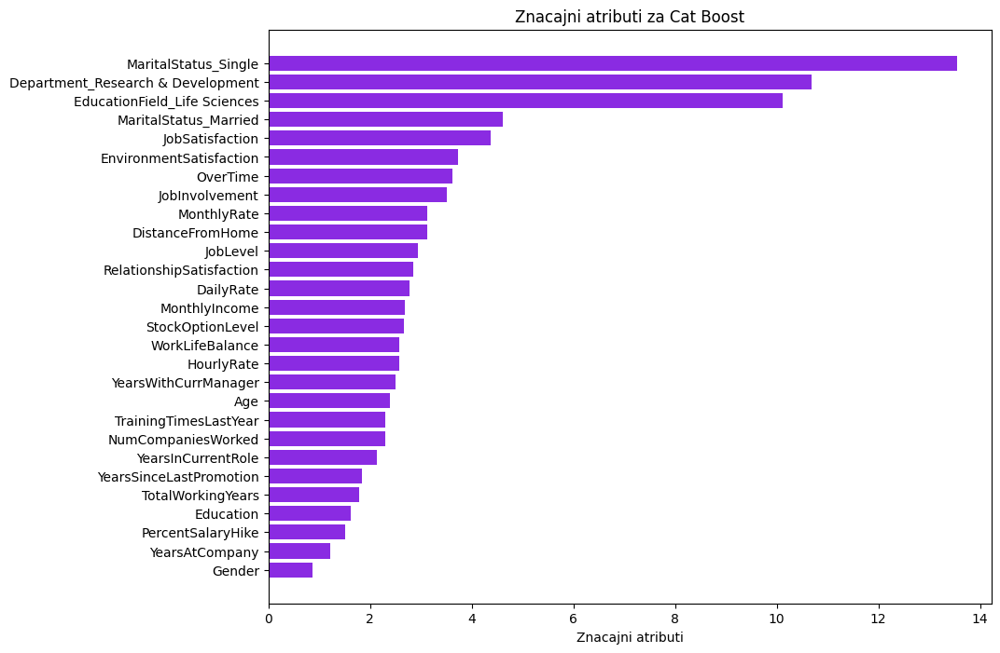

In [143]:
model_cb = cb.CatBoostClassifier()
model_cb.fit(x_train, y_train)
y_pred_cb = model_cb.predict(x_test)
y_pred_prob_cb = model_cb.predict_proba(x_test)[:, 1]

print("########### MODEL Cat Boost ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_cb, x_train,y_train,x_test, y_test,y_pred_cb, y_pred_prob_cb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Cat Boost", y_test,y_pred_cb, y_pred_prob_cb)
lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_cb, "Cat Boost", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Cat Boost",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [144]:
#### JOS VISE OSNOVNIH MODELA

In [145]:
from sklearn.naive_bayes import GaussianNB

########### MODEL Naive Bayes ###########
Krosvalidacioni scopre:  87.58%
ROC_AUC Score :  68.40%


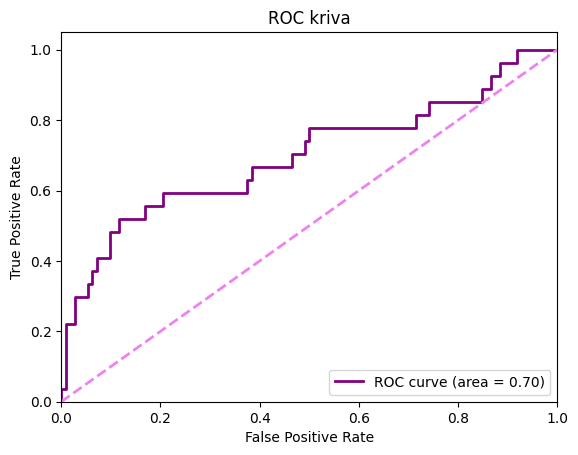

#################################
Accuracy (Tačnost): 0.762589928057554
#################################
Precision (Preciznost): 0.4166666666666667
#################################
Recall(odziv): 0.5555555555555556
###############################
F1 Score: 0.4761904761904762
ROC AUC: 0.6977513227513227
Confusion Matrix (matrica konfuzije):
[[91 21]
 [12 15]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.88      0.81      0.85       112
           1       0.42      0.56      0.48        27

    accuracy                           0.76       139
   macro avg       0.65      0.68      0.66       139
weighted avg       0.79      0.76      0.77       139




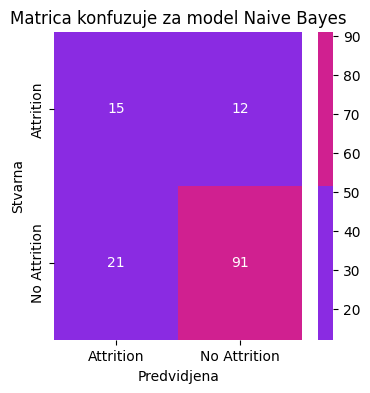

              precision    recall  f1-score   support

           0       0.88      0.81      0.85       112
           1       0.42      0.56      0.48        27

    accuracy                           0.76       139
   macro avg       0.65      0.68      0.66       139
weighted avg       0.79      0.76      0.77       139



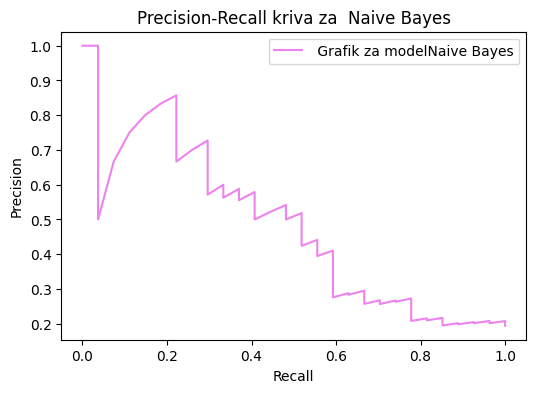

Model nema podržanu značajnost attributa


In [146]:
model_gnb = GaussianNB()
model_gnb.fit(x_train, y_train)
y_pred_gnb = model_gnb.predict(x_test)
y_pred_prob_gnb = model_gnb.predict_proba(x_test)[:, 1]

print("########### MODEL Naive Bayes ###########")
krosval_score=krosvalidacija_i_prikaz_roc_auc_krive(model_gnb, x_train,y_train,x_test, y_test,y_pred_gnb, y_pred_prob_gnb)

accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike("Naive Bayes", y_test,y_pred_gnb, y_pred_prob_gnb)

lista_znacajnih_atributa = prikaz_znacajnosti_atributa(model_gnb, "Naive Bayes", feature_names)
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":accuracy,
"Precision":precision,
"Recall" :recall,
"F1-score" :f1_score_,
"ROC_AUC_SCORE":roc_auc_score_,
"KrosvalidacioniScore":krosval_score,
"FALSE NEGATIVI":falseNegativi,
"HIPERPARAMETRIZACIJA":"NO",
"NAJBOLJI PARAMETRI":"NONE",
"NAJZNACAJNIJI ATRIBUTI":lista_znacajnih_atributa
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [147]:
# from sklearn.svm import SVC

In [148]:
# model_svc = SVC(probability=True)
# model_svc.fit(x_train, y_train)
# y_pred_svc = model_svc.predict(x_test)
# y_pred_prob_svc = model_svc.predict_proba(x_test)[:, 1]

# print("########### MODEL Support Vector Machine ###########")
# krosvalidacija_i_prikaz_roc_auc_krive(model_svc, x_train,y_train,x_test, y_test,y_pred_svc, y_pred_prob_svc)

# evaluacija_modela_metrike("Support Vector Machine", y_test,y_pred_svc, y_pred_prob_svc)

In [149]:
from sklearn.model_selection import GridSearchCV

In [160]:
# OVO ZA MACHINE LEARNING STUDIO
# param_grids = {
#     'Logistic Regression': {
#         'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
#         'solver': ['lbfgs', 'liblinear', 'saga'],
#         'penalty': ['l2', 'none']
#     },
#     'Decision Tree': {
#         'max_depth': [None] + list(range(10, 51, 10)),
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2)),
#         'criterion': ['gini', 'entropy']
#     },
#     'Random Forest': {
#         'n_estimators': list(range(50, 501, 50)),
#         'max_depth': [None] + list(range(10, 41, 10)),
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2)),
#         'criterion': ['gini', 'entropy']
#     },
#     'Gradient Boosting': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'max_depth': list(range(3, 10, 2)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'min_samples_split': list(range(2, 21, 3)),
#         'min_samples_leaf': list(range(1, 11, 2))
#     },
#     'AdaBoost': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.5, 1, 1.5]
#     },
#     'Bagging': {
#         'n_estimators': list(range(10, 201, 20)),
#         'max_samples': [0.5, 0.7, 0.9, 1.0],
#         'max_features': [0.5, 0.7, 0.9, 1.0]
#     },
#     'XGBoost': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'max_depth': list(range(3, 10, 2)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
#         'gamma': [0, 0.1, 0.3, 0.5],
#         'reg_alpha': [0, 0.1, 0.5, 1],
#         'reg_lambda': [1, 1.5, 2, 3]
#     },
#     'LightGBM': {
#         'n_estimators': list(range(50, 501, 50)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'num_leaves': list(range(31, 256, 31)),
#         'max_depth': [-1] + list(range(10, 41, 10)),
#         'subsample': [0.7, 0.8, 0.9, 1.0],
#         'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
#         'reg_alpha': [0, 0.1, 0.5, 1],
#         'reg_lambda': [1, 1.5, 2, 3]
#     },
#     'CatBoost': {
#         'iterations': list(range(100, 501, 100)),
#         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
#         'depth': list(range(3, 10, 2)),
#         'l2_leaf_reg': list(range(1, 10, 2))
#     },
#     'GaussianNB': {
#         'var_smoothing': np.logspace(0, -9, num=100)
#     }
# }


In [150]:
param_grids = {
    'Logistic Regression': {
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['lbfgs', 'liblinear']
    },
    'Decision Tree': {
        'max_depth': [None, 10, 20, 30, 40],
        'min_samples_split': [2, 5, 10,20]
    },
    'Random Forest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10,15,20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    'AdaBoost': {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    'Bagging': {
        'n_estimators': [10, 50, 100],
        'max_samples': [0.5, 1.0],
        'max_features': [0.5, 1.0]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 200,500,1000],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    'LightGBM': {
        'n_estimators': [50, 100, 200,500,1000],
        'learning_rate': [0.01, 0.1, 0.2],
        'num_leaves': [31, 62, 127]
    },
    'CatBoost': {
        'iterations': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'depth': [3, 5, 7]
    },
    'GaussianNB': {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]
    }
}


In [151]:
def treniranje_i_tjunovanje(model, param_grid, model_name):
    print(f"Treniranje modela {model_name} nakon optimizacije parametara ")
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')
    grid_search.fit(x_train, y_train)
    
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(x_test)
    y_pred_prob = best_model.predict_proba(x_test)[:, 1]
    feature_names=x_test.columns
   
    kros_val_score = krosvalidacija_i_prikaz_roc_auc_krive(best_model, x_train, y_train, x_test, y_test,y_pred,y_pred_prob)
    print(f"################ METRIKE ZA MODEL {model_name} sa optimizacijom parametara ##################")
    accuracy, precision, recall,f1_score_,roc_auc_score_,falseNegativi=evaluacija_modela_metrike( f"{model_name} sa optimizacijom parametara", y_test,y_pred,y_pred_prob)
    lista_znacajnih_atributa =prikaz_znacajnosti_atributa(best_model, model_name, feature_names)
    table_output=[accuracy,precision,recall,f1_score_,roc_auc_score_,kros_val_score,falseNegativi,"yes",grid_search.best_params_,lista_znacajnih_atributa]    
    return best_model,grid_search.best_params_,table_output


Treniranje modela Logistic Regression nakon optimizacije parametara 


c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

Krosvalidacioni scopre:  91.25%
ROC_AUC Score :  71.02%


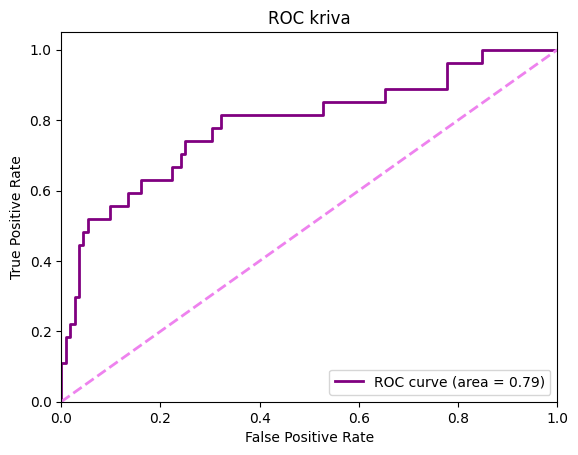

################ METRIKE ZA MODEL Logistic Regression sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8273381294964028
#################################
Precision (Preciznost): 0.56
#################################
Recall(odziv): 0.5185185185185185
###############################
F1 Score: 0.5384615384615384
ROC AUC: 0.7910052910052909
Confusion Matrix (matrica konfuzije):
[[101  11]
 [ 13  14]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.89      0.90      0.89       112
           1       0.56      0.52      0.54        27

    accuracy                           0.83       139
   macro avg       0.72      0.71      0.72       139
weighted avg       0.82      0.83      0.82       139




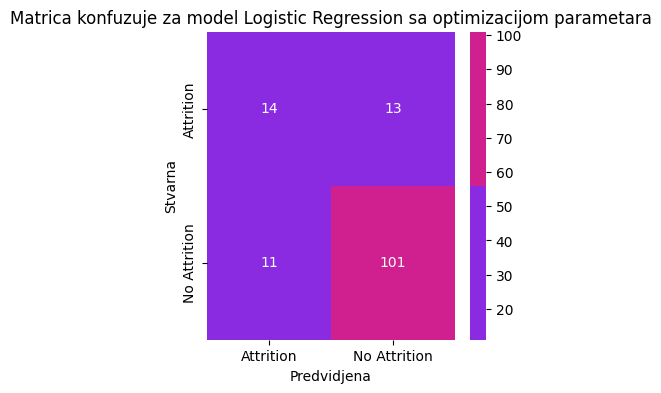

              precision    recall  f1-score   support

           0       0.89      0.90      0.89       112
           1       0.56      0.52      0.54        27

    accuracy                           0.83       139
   macro avg       0.72      0.71      0.72       139
weighted avg       0.82      0.83      0.82       139



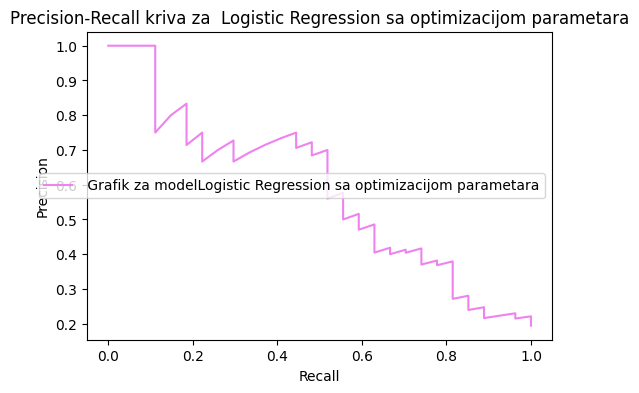

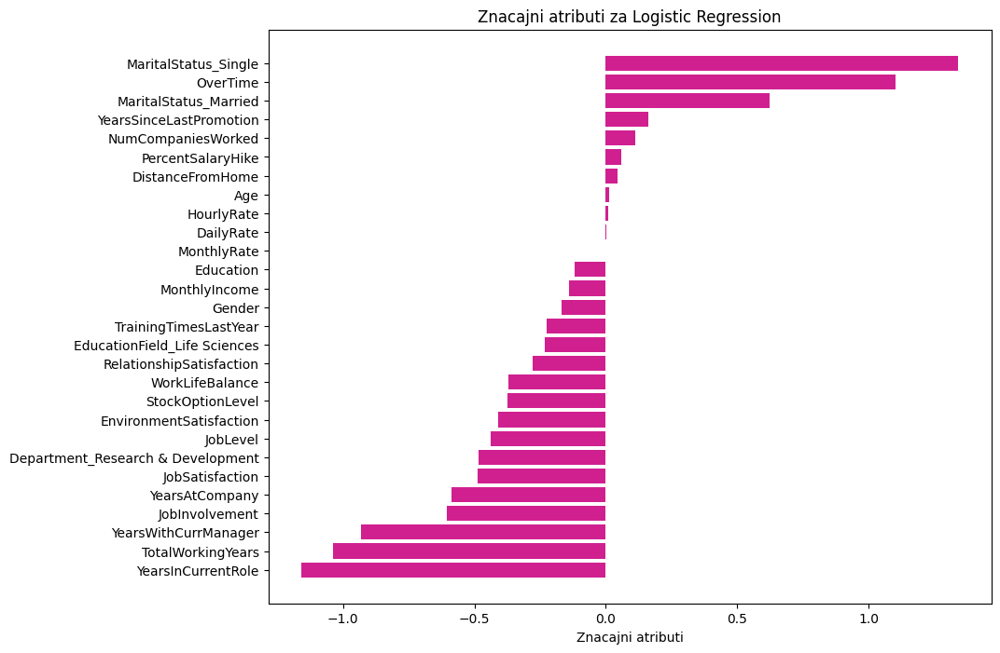

In [152]:
best_model_lr, best_params_lr, table_out_lr = treniranje_i_tjunovanje(LogisticRegression(), param_grids['Logistic Regression'], "Logistic Regression")

red_new= pd.DataFrame([{
"Ime modela": "Logistic Regression",
"Accuracy":table_out_lr[0],
"Precision":table_out_lr[1],
"Recall" :table_out_lr[2],
"F1-score" :table_out_lr[3],
"ROC_AUC_SCORE":table_out_lr[4],
"KrosvalidacioniScore":table_out_lr[5],
"FALSE NEGATIVI":table_out_lr[6],
"HIPERPARAMETRIZACIJA":table_out_lr[7],
"NAJBOLJI PARAMETRI":table_out_lr[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lr[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Decision Tree nakon optimizacije parametara 
Krosvalidacioni scopre:  87.01%
ROC_AUC Score :  49.37%


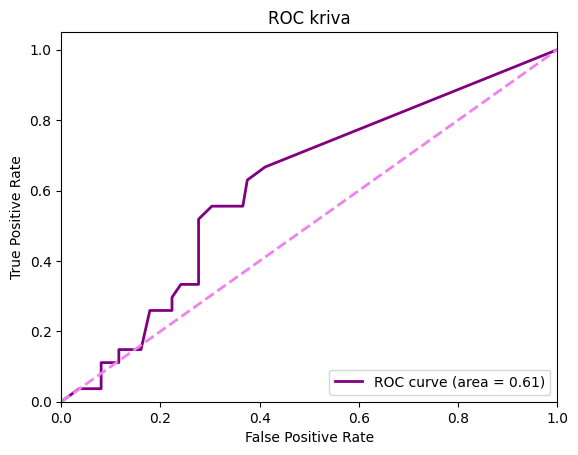

################ METRIKE ZA MODEL Decision Tree sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.7050359712230215
#################################
Precision (Preciznost): 0.18181818181818182
#################################
Recall(odziv): 0.14814814814814814
###############################
F1 Score: 0.16326530612244897
ROC AUC: 0.6142526455026455
Confusion Matrix (matrica konfuzije):
[[94 18]
 [23  4]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.80      0.84      0.82       112
           1       0.18      0.15      0.16        27

    accuracy                           0.71       139
   macro avg       0.49      0.49      0.49       139
weighted avg       0.68      0.71      0.69       139




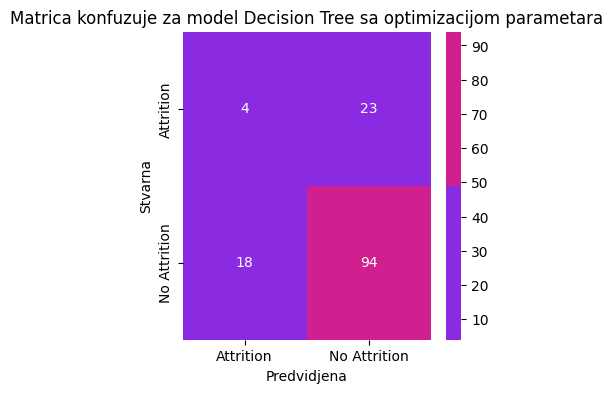

              precision    recall  f1-score   support

           0       0.80      0.84      0.82       112
           1       0.18      0.15      0.16        27

    accuracy                           0.71       139
   macro avg       0.49      0.49      0.49       139
weighted avg       0.68      0.71      0.69       139



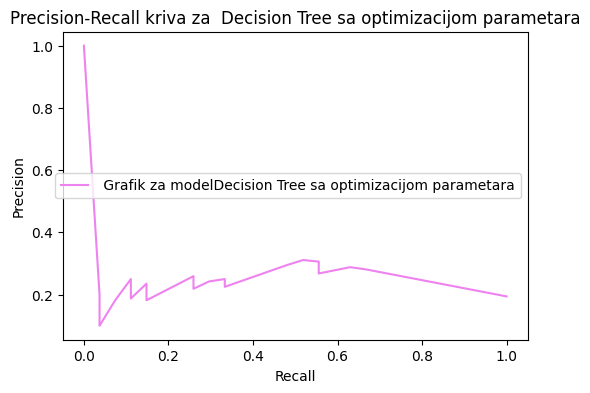

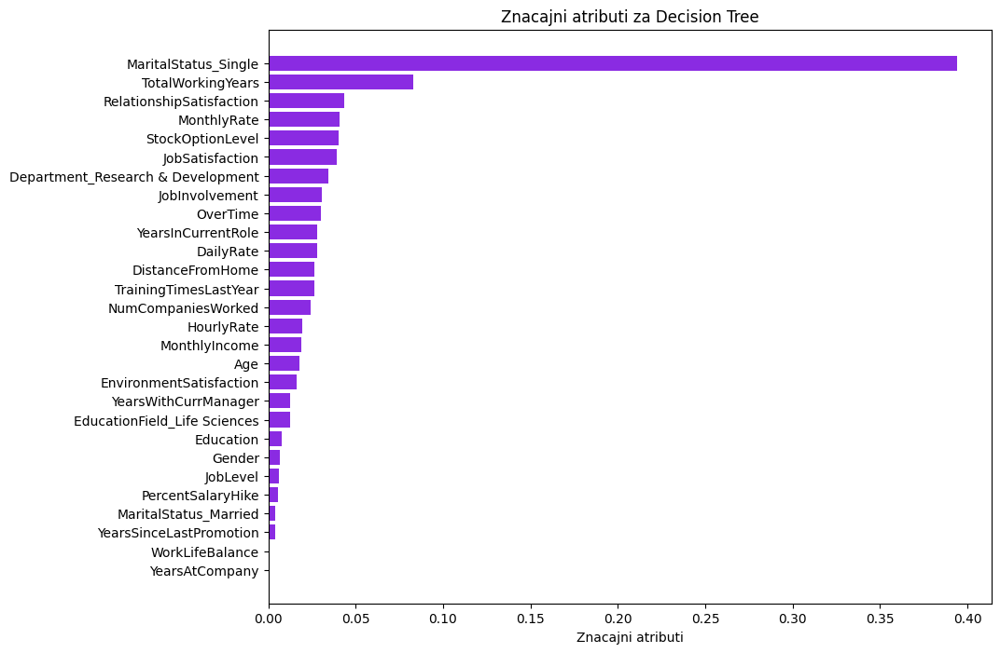

In [153]:
best_model_dt, best_params_dt, table_out_dt = treniranje_i_tjunovanje(DecisionTreeClassifier(), param_grids['Decision Tree'], "Decision Tree")
red_new= pd.DataFrame([{
"Ime modela": "Decision Tree",
"Accuracy":table_out_dt[0],
"Precision":table_out_dt[1],
"Recall" :table_out_dt[2],
"F1-score" :table_out_dt[3],
"ROC_AUC_SCORE":table_out_dt[4],
"KrosvalidacioniScore":table_out_dt[5],
"FALSE NEGATIVI":table_out_dt[6],
"HIPERPARAMETRIZACIJA":table_out_dt[7],
"NAJBOLJI PARAMETRI":table_out_dt[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_dt[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Random Forest nakon optimizacije parametara 
Krosvalidacioni scopre:  96.90%
ROC_AUC Score :  60.22%


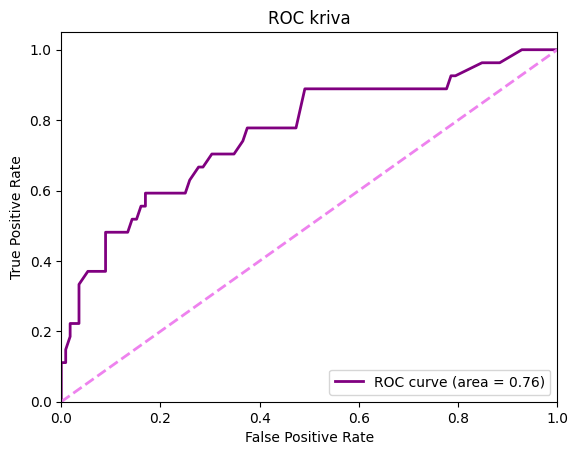

################ METRIKE ZA MODEL Random Forest sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8345323741007195
#################################
Precision (Preciznost): 0.75
#################################
Recall(odziv): 0.2222222222222222
###############################
F1 Score: 0.34285714285714286
ROC AUC: 0.7620701058201058
Confusion Matrix (matrica konfuzije):
[[110   2]
 [ 21   6]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.84      0.98      0.91       112
           1       0.75      0.22      0.34        27

    accuracy                           0.83       139
   macro avg       0.79      0.60      0.62       139
weighted avg       0.82      0.83      0.80       139




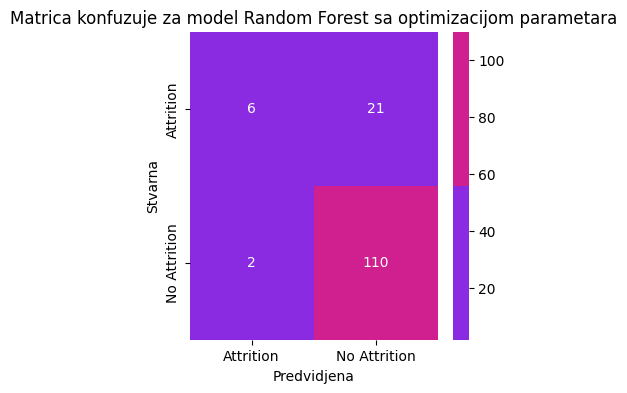

              precision    recall  f1-score   support

           0       0.84      0.98      0.91       112
           1       0.75      0.22      0.34        27

    accuracy                           0.83       139
   macro avg       0.79      0.60      0.62       139
weighted avg       0.82      0.83      0.80       139



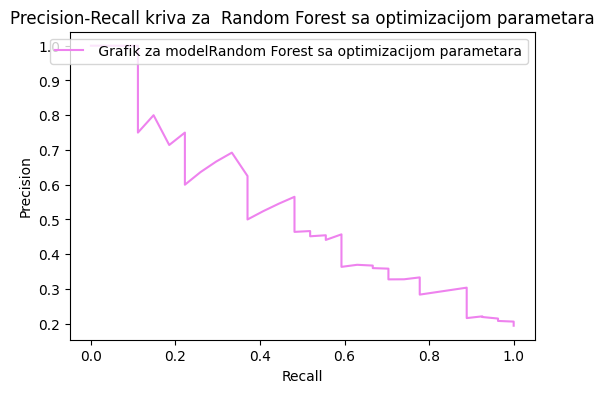

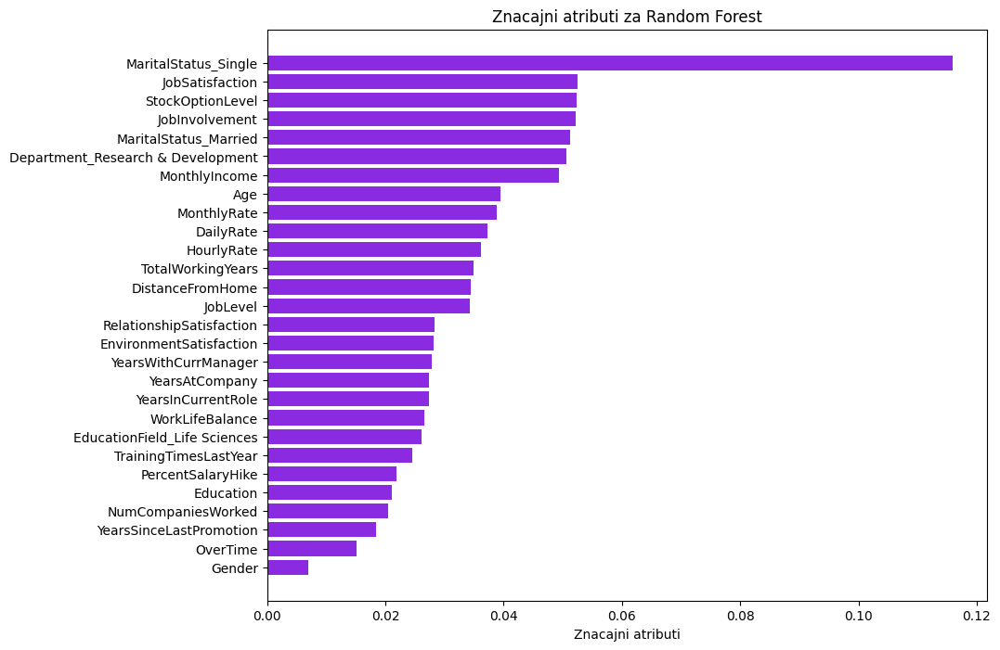

In [154]:
best_model_rf, best_params_rf, table_out_rf = treniranje_i_tjunovanje(RandomForestClassifier(), param_grids['Random Forest'], "Random Forest")

red_new= pd.DataFrame([{
"Ime modela": "Random Forest",
"Accuracy":table_out_rf[0],
"Precision":table_out_rf[1],
"Recall" :table_out_rf[2],
"F1-score" :table_out_rf[3],
"ROC_AUC_SCORE":table_out_rf[4],
"KrosvalidacioniScore":table_out_rf[5],
"FALSE NEGATIVI":table_out_rf[6],
"HIPERPARAMETRIZACIJA":table_out_rf[7],
"NAJBOLJI PARAMETRI":table_out_rf[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_rf[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Gradient Boosting nakon optimizacije parametara 
Krosvalidacioni scopre:  97.23%
ROC_AUC Score :  61.62%


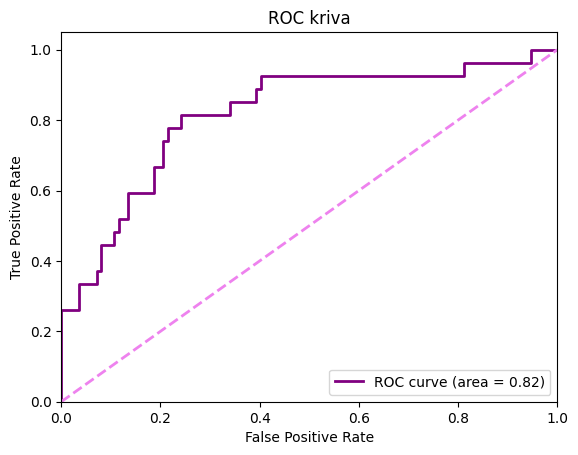

################ METRIKE ZA MODEL Gradient Boosting sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8345323741007195
#################################
Precision (Preciznost): 0.7
#################################
Recall(odziv): 0.25925925925925924
###############################
F1 Score: 0.37837837837837834
ROC AUC: 0.8174603174603174
Confusion Matrix (matrica konfuzije):
[[109   3]
 [ 20   7]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.84      0.97      0.90       112
           1       0.70      0.26      0.38        27

    accuracy                           0.83       139
   macro avg       0.77      0.62      0.64       139
weighted avg       0.82      0.83      0.80       139




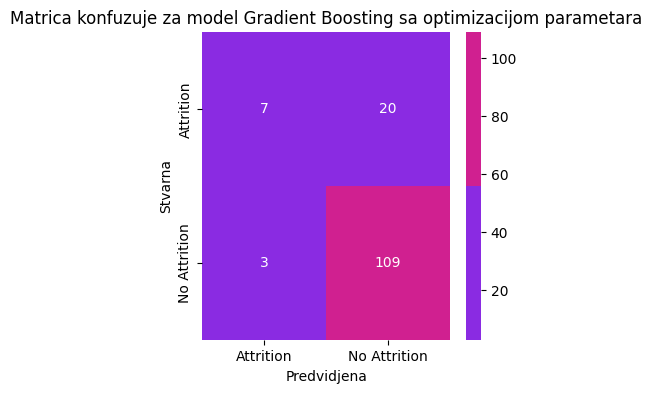

              precision    recall  f1-score   support

           0       0.84      0.97      0.90       112
           1       0.70      0.26      0.38        27

    accuracy                           0.83       139
   macro avg       0.77      0.62      0.64       139
weighted avg       0.82      0.83      0.80       139



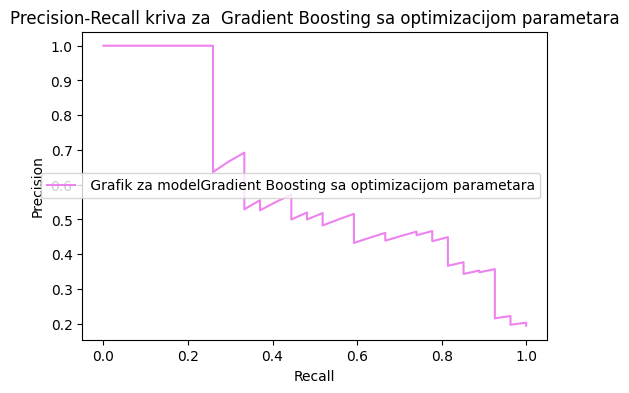

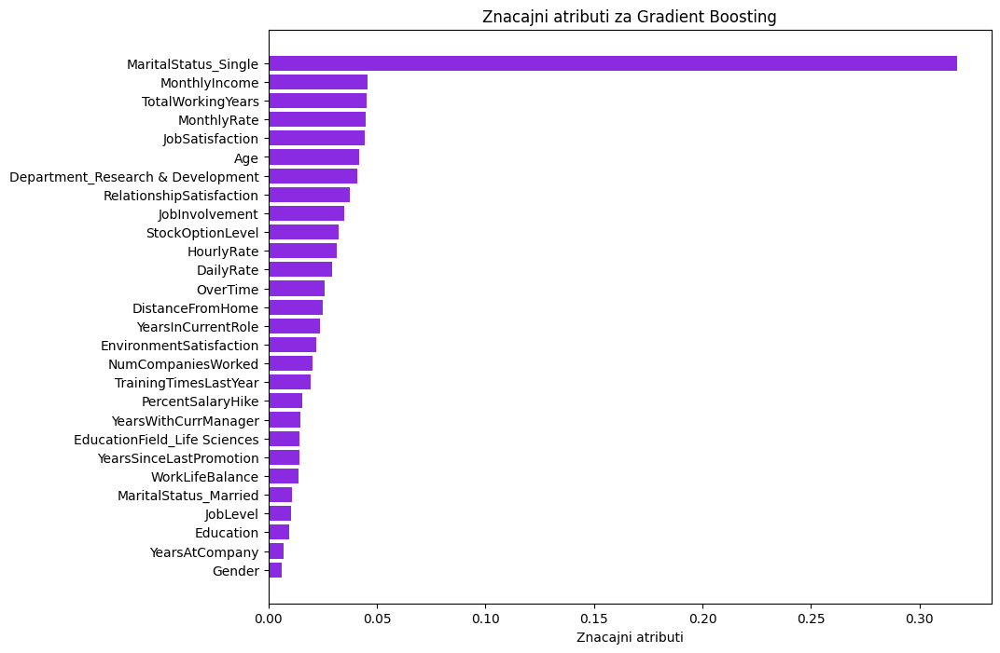

In [155]:
best_model_gb,best_params_gb, table_out_gb = treniranje_i_tjunovanje(GradientBoostingClassifier(), param_grids['Gradient Boosting'], "Gradient Boosting")

red_new= pd.DataFrame([{
"Ime modela": "Gradient Boosting",
"Accuracy":table_out_gb[0],
"Precision":table_out_gb[1],
"Recall" :table_out_gb[2],
"F1-score" :table_out_gb[3],
"ROC_AUC_SCORE":table_out_gb[4],
"KrosvalidacioniScore":table_out_gb[5],
"FALSE NEGATIVI":table_out_gb[6],
"HIPERPARAMETRIZACIJA":table_out_gb[7],
"NAJBOLJI PARAMETRI":table_out_gb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_gb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela AdaBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  95.22%
ROC_AUC Score :  65.39%


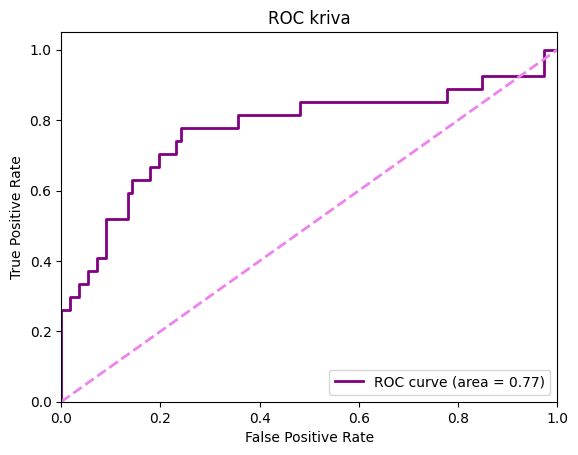

################ METRIKE ZA MODEL AdaBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8273381294964028
#################################
Precision (Preciznost): 0.5882352941176471
#################################
Recall(odziv): 0.37037037037037035
###############################
F1 Score: 0.45454545454545453
ROC AUC: 0.7734788359788359
Confusion Matrix (matrica konfuzije):
[[105   7]
 [ 17  10]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.86      0.94      0.90       112
           1       0.59      0.37      0.45        27

    accuracy                           0.83       139
   macro avg       0.72      0.65      0.68       139
weighted avg       0.81      0.83      0.81       139




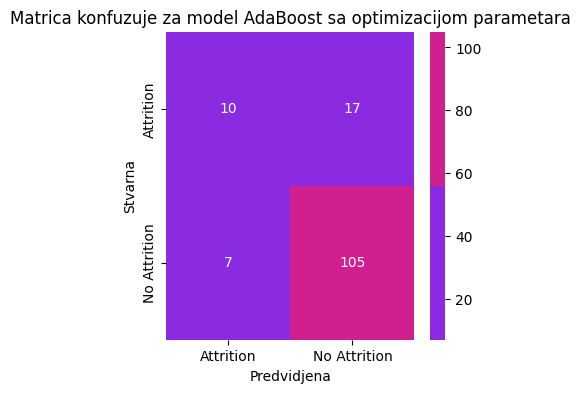

              precision    recall  f1-score   support

           0       0.86      0.94      0.90       112
           1       0.59      0.37      0.45        27

    accuracy                           0.83       139
   macro avg       0.72      0.65      0.68       139
weighted avg       0.81      0.83      0.81       139



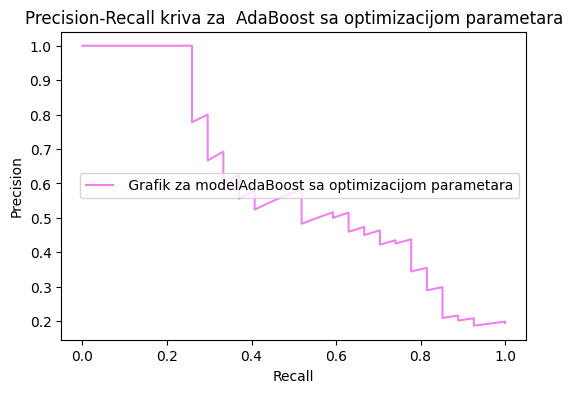

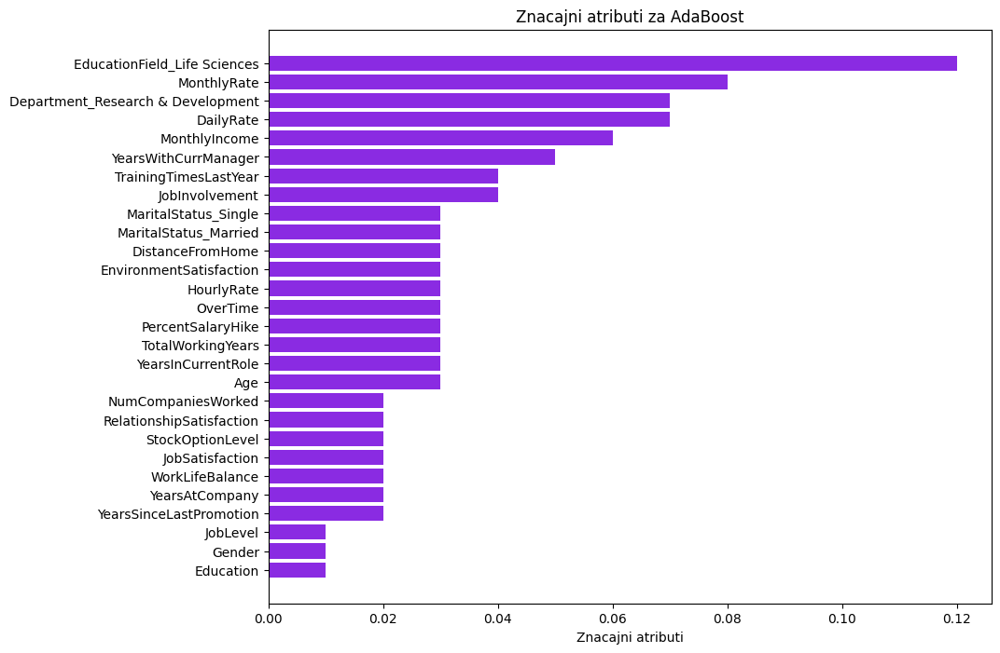

In [156]:
best_model_ab,best_params_ab, table_out_ab = treniranje_i_tjunovanje(AdaBoostClassifier(), param_grids['AdaBoost'], "AdaBoost")

red_new= pd.DataFrame([{
"Ime modela": "Ada Boost",
"Accuracy":table_out_ab[0],
"Precision":table_out_ab[1],
"Recall" :table_out_ab[2],
"F1-score" :table_out_ab[3],
"ROC_AUC_SCORE":table_out_ab[4],
"KrosvalidacioniScore":table_out_ab[5],
"FALSE NEGATIVI":table_out_ab[6],
"HIPERPARAMETRIZACIJA":table_out_ab[7],
"NAJBOLJI PARAMETRI":table_out_ab[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_ab[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela Bagging nakon optimizacije parametara 
Krosvalidacioni scopre:  96.78%
ROC_AUC Score :  58.37%


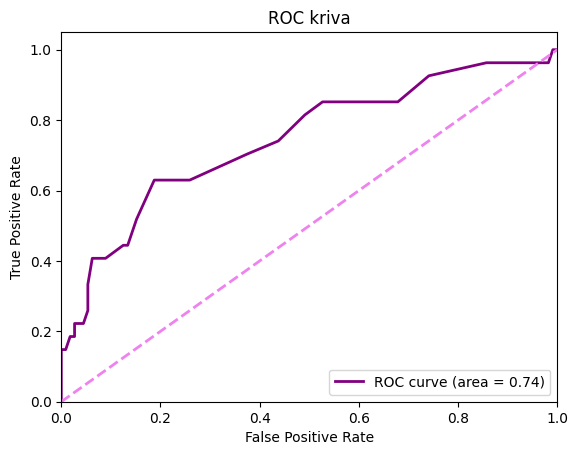

################ METRIKE ZA MODEL Bagging sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8273381294964028
#################################
Precision (Preciznost): 0.7142857142857143
#################################
Recall(odziv): 0.18518518518518517
###############################
F1 Score: 0.2941176470588235
ROC AUC: 0.7445436507936507
Confusion Matrix (matrica konfuzije):
[[110   2]
 [ 22   5]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.83      0.98      0.90       112
           1       0.71      0.19      0.29        27

    accuracy                           0.83       139
   macro avg       0.77      0.58      0.60       139
weighted avg       0.81      0.83      0.78       139




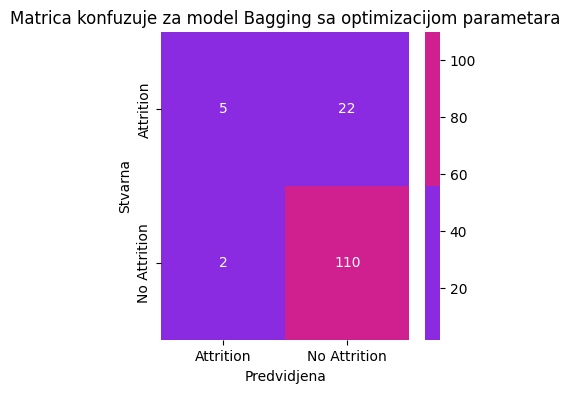

              precision    recall  f1-score   support

           0       0.83      0.98      0.90       112
           1       0.71      0.19      0.29        27

    accuracy                           0.83       139
   macro avg       0.77      0.58      0.60       139
weighted avg       0.81      0.83      0.78       139



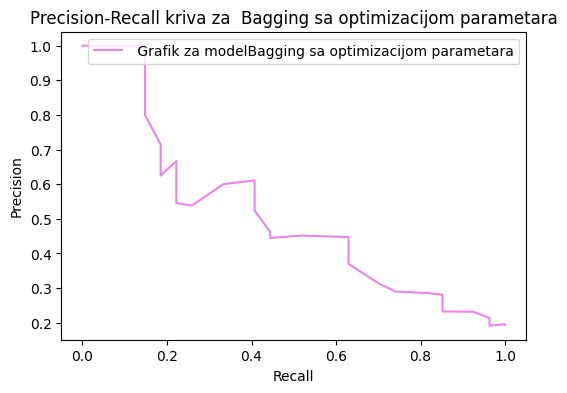

Model nema podržanu značajnost attributa


In [157]:
best_model_bg, best_params_bg, table_out_bg = treniranje_i_tjunovanje(BaggingClassifier(), param_grids['Bagging'], "Bagging")
red_new= pd.DataFrame([{
"Ime modela": "Bagging",
"Accuracy":table_out_bg[0],
"Precision":table_out_bg[1],
"Recall" :table_out_bg[2],
"F1-score" :table_out_bg[3],
"ROC_AUC_SCORE":table_out_bg[4],
"KrosvalidacioniScore":table_out_bg[5],
"FALSE NEGATIVI":table_out_bg[6],
"HIPERPARAMETRIZACIJA":table_out_bg[7],
"NAJBOLJI PARAMETRI":table_out_bg[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_bg[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela XGBoost nakon optimizacije parametara 


c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\andjelami\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `u

Krosvalidacioni scopre:  96.84%
ROC_AUC Score :  63.48%


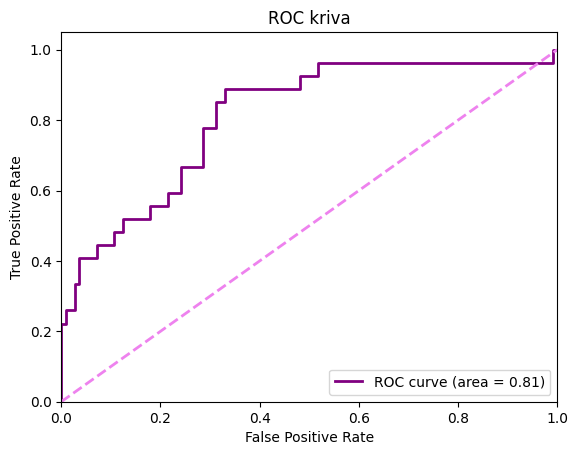

################ METRIKE ZA MODEL XGBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.841726618705036
#################################
Precision (Preciznost): 0.7272727272727273
#################################
Recall(odziv): 0.2962962962962963
###############################
F1 Score: 0.42105263157894735
ROC AUC: 0.8105158730158729
Confusion Matrix (matrica konfuzije):
[[109   3]
 [ 19   8]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.97      0.91       112
           1       0.73      0.30      0.42        27

    accuracy                           0.84       139
   macro avg       0.79      0.63      0.66       139
weighted avg       0.83      0.84      0.81       139




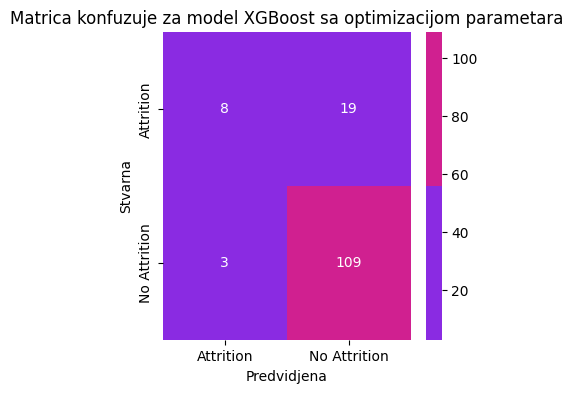

              precision    recall  f1-score   support

           0       0.85      0.97      0.91       112
           1       0.73      0.30      0.42        27

    accuracy                           0.84       139
   macro avg       0.79      0.63      0.66       139
weighted avg       0.83      0.84      0.81       139



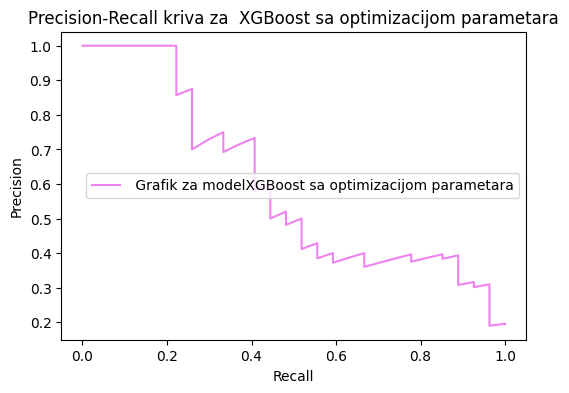

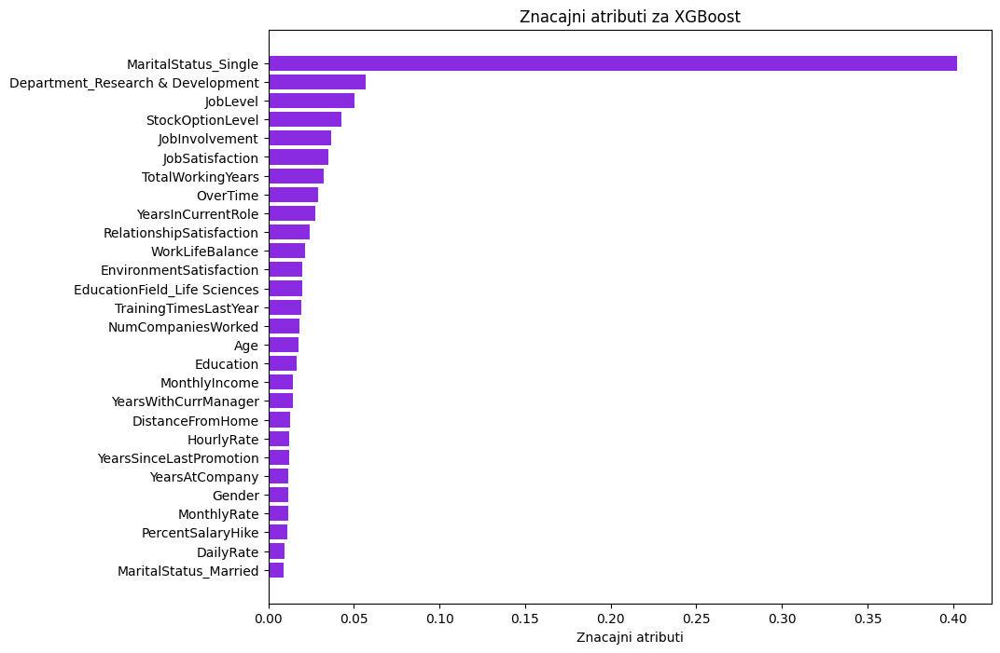

In [158]:
best_model_xgb, best_params_xgb, table_out_xgb = treniranje_i_tjunovanje(xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'), param_grids['XGBoost'], "XGBoost")
red_new= pd.DataFrame([{
"Ime modela": "XGBoost",
"Accuracy":table_out_xgb[0],
"Precision":table_out_xgb[1],
"Recall" :table_out_xgb[2],
"F1-score" :table_out_xgb[3],
"ROC_AUC_SCORE":table_out_xgb[4],
"KrosvalidacioniScore":table_out_xgb[5],
"FALSE NEGATIVI":table_out_xgb[6],
"HIPERPARAMETRIZACIJA":table_out_xgb[7],
"NAJBOLJI PARAMETRI":table_out_xgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_xgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [159]:
best_model_lgb,best_params_lgb, table_out_lgb = treniranje_i_tjunovanje(lgb.LGBMClassifier(), param_grids['LightGBM'], "LightGBM")
red_new= pd.DataFrame([{
"Ime modela": "LightGBM",
"Accuracy":table_out_lgb[0],
"Precision":table_out_lgb[1],
"Recall" :table_out_lgb[2],
"F1-score" :table_out_lgb[3],
"ROC_AUC_SCORE":table_out_lgb[4],
"KrosvalidacioniScore":table_out_lgb[5],
"FALSE NEGATIVI":table_out_lgb[6],
"HIPERPARAMETRIZACIJA":table_out_lgb[7],
"NAJBOLJI PARAMETRI":table_out_lgb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_lgb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

Treniranje modela LightGBM nakon optimizacije parametara 
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 712, number of negative: 836
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2109
[LightGBM] [Info] Number of data points in the train set: 1548, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.459948 -> initscore=-0.160551
[LightGBM] [Info] Start training from score -0.160551
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 711, number of negative: 837
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1756
[LightGBM] [Info] Number of da

Treniranje modela CatBoost nakon optimizacije parametara 
Krosvalidacioni scopre:  96.93%
ROC_AUC Score :  62.58%


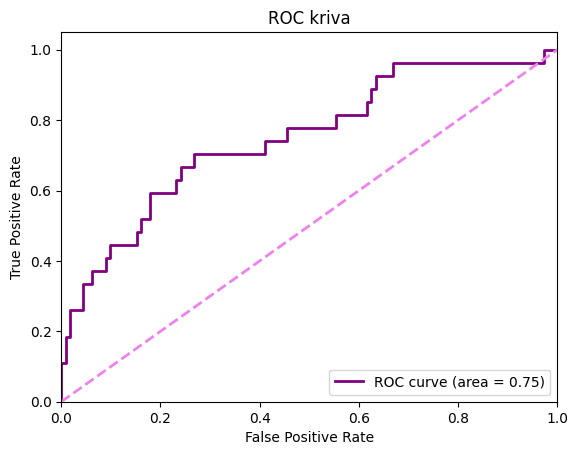

################ METRIKE ZA MODEL CatBoost sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.8273381294964028
#################################
Precision (Preciznost): 0.6153846153846154
#################################
Recall(odziv): 0.2962962962962963
###############################
F1 Score: 0.4
ROC AUC: 0.7503306878306878
Confusion Matrix (matrica konfuzije):
[[107   5]
 [ 19   8]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.85      0.96      0.90       112
           1       0.62      0.30      0.40        27

    accuracy                           0.83       139
   macro avg       0.73      0.63      0.65       139
weighted avg       0.80      0.83      0.80       139




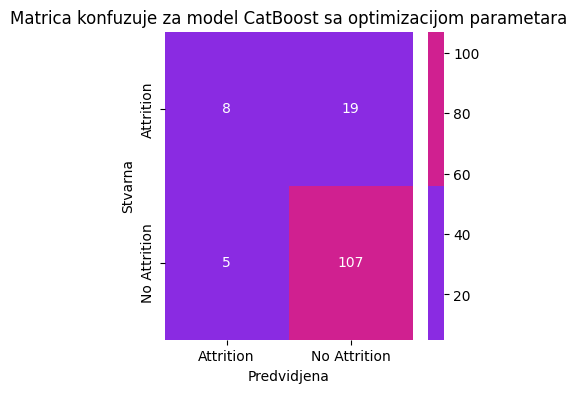

              precision    recall  f1-score   support

           0       0.85      0.96      0.90       112
           1       0.62      0.30      0.40        27

    accuracy                           0.83       139
   macro avg       0.73      0.63      0.65       139
weighted avg       0.80      0.83      0.80       139



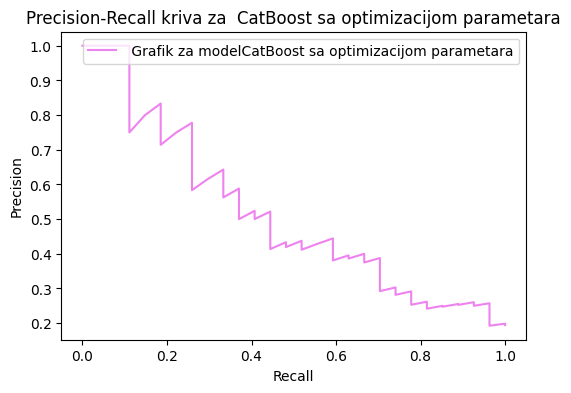

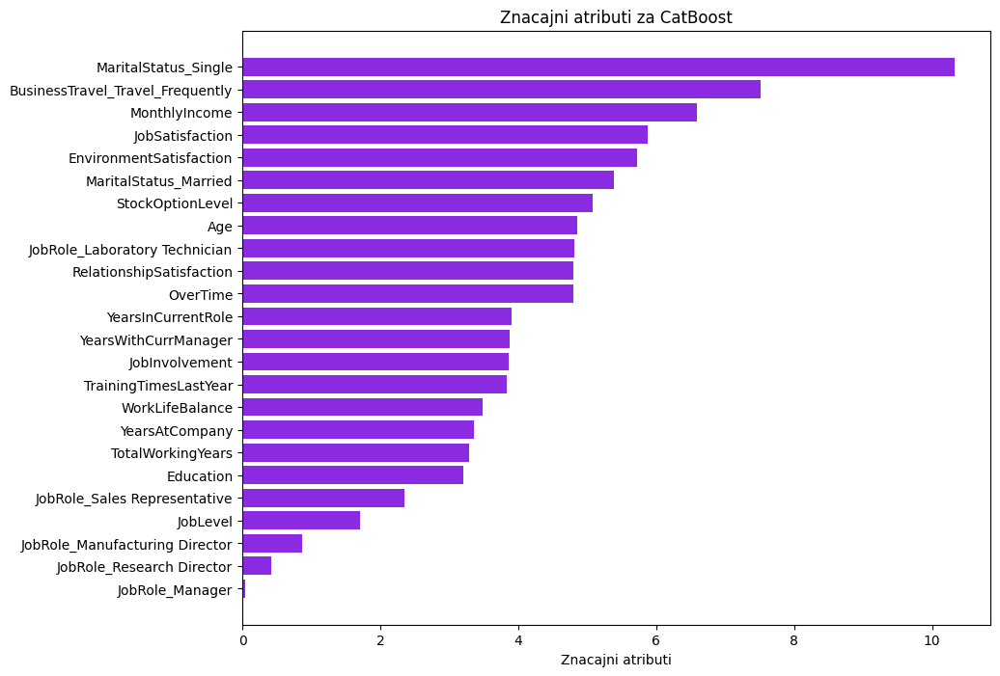

In [ ]:
best_model_cb, best_params_cb, table_out_cb = treniranje_i_tjunovanje(cb.CatBoostClassifier(silent=True), param_grids['CatBoost'], "CatBoost")
red_new= pd.DataFrame([{
"Ime modela": "CatBoost",
"Accuracy":table_out_cb[0],
"Precision":table_out_cb[1],
"Recall" :table_out_cb[2],
"F1-score" :table_out_cb[3],
"ROC_AUC_SCORE":table_out_cb[4],
"KrosvalidacioniScore":table_out_cb[5],
"FALSE NEGATIVI":table_out_cb[6],
"HIPERPARAMETRIZACIJA":table_out_cb[7],
"NAJBOLJI PARAMETRI":table_out_cb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_cb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [172]:
#best_params_svc = treniranje_i_tjunovanje(SVC(probability=True), param_grids['SVC'], "Support Vector Machine")

Treniranje modela Naive Bayes nakon optimizacije parametara 
Krosvalidacioni scopre:  83.38%
ROC_AUC Score :  60.70%


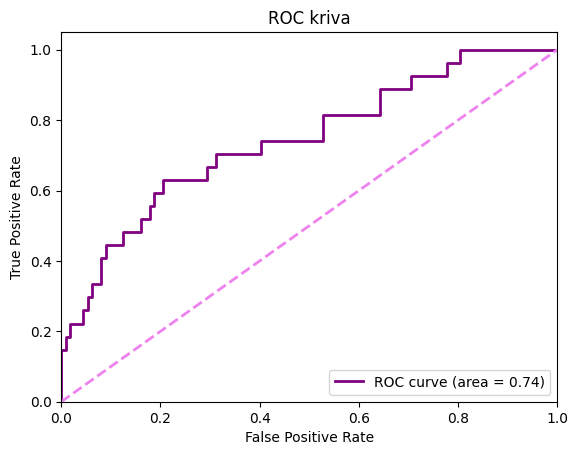

################ METRIKE ZA MODEL Naive Bayes sa optimizacijom parametara ##################
#################################
Accuracy (Tačnost): 0.5251798561151079
#################################
Precision (Preciznost): 0.25316455696202533
#################################
Recall(odziv): 0.7407407407407407
###############################
F1 Score: 0.37735849056603776
ROC AUC: 0.7433862433862434
Confusion Matrix (matrica konfuzije):
[[53 59]
 [ 7 20]]
Classification Report (klasifikacijski izvestaj):
              precision    recall  f1-score   support

           0       0.88      0.47      0.62       112
           1       0.25      0.74      0.38        27

    accuracy                           0.53       139
   macro avg       0.57      0.61      0.50       139
weighted avg       0.76      0.53      0.57       139




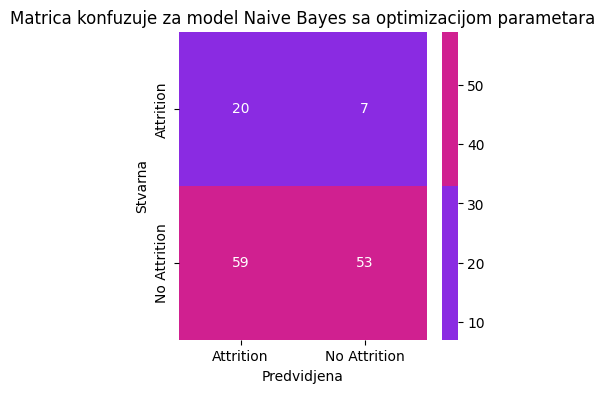

              precision    recall  f1-score   support

           0       0.88      0.47      0.62       112
           1       0.25      0.74      0.38        27

    accuracy                           0.53       139
   macro avg       0.57      0.61      0.50       139
weighted avg       0.76      0.53      0.57       139



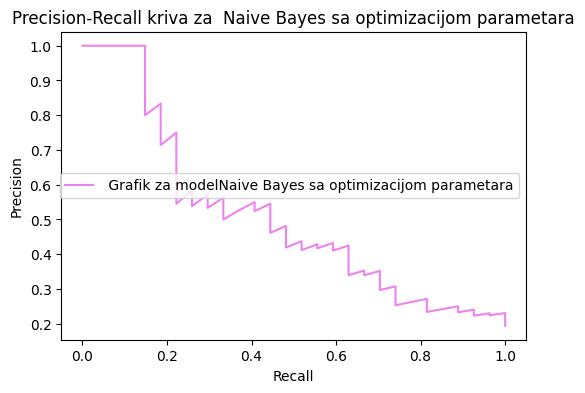

Model nema podržanu značajnost attributa


In [ ]:
best_model,best_params_NB, table_out_nb = treniranje_i_tjunovanje(GaussianNB(), param_grids['GaussianNB'], "Naive Bayes")
red_new= pd.DataFrame([{
"Ime modela": "Naive Bayes",
"Accuracy":table_out_nb[0],
"Precision":table_out_nb[1],
"Recall" :table_out_nb[2],
"F1-score" :table_out_nb[3],
"ROC_AUC_SCORE":table_out_nb[4],
"KrosvalidacioniScore":table_out_nb[5],
"FALSE NEGATIVI":table_out_nb[6],
"HIPERPARAMETRIZACIJA":table_out_nb[7],
"NAJBOLJI PARAMETRI":table_out_nb[8],
"NAJZNACAJNIJI ATRIBUTI":table_out_nb[9]
}])
REZULTATI_TABELA = pd.concat([REZULTATI_TABELA, red_new], ignore_index=True)

In [ ]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False)

,Ime modela,Accuracy,Precision,Recall,F1-score,ROC_AUC_SCORE,KrosvalidacioniScore,FALSE NEGATIVI,HIPERPARAMETRIZACIJA,NAJBOLJI PARAMETRI,NAJZNACAJNIJI ATRIBUTI
13,Gradient Boosting,0.841727,0.692308,0.333333,0.450000,0.790013,0.969369,18,yes,"{'learning_rate': 0.2, 'max_depth': 7, 'n_esti...","[JobRole_Manager, JobRole_Research Director, J..."
17,LightGBM,0.827338,0.615385,0.296296,0.400000,0.783399,0.969150,19,yes,"{'learning_rate': 0.1, 'n_estimators': 200, 'n...","[JobRole_Manager, JobRole_Research Director, J..."
7,LGBM Classifier,0.834532,0.666667,0.296296,0.410256,0.781746,0.967043,19,NO,NONE,"[JobRole_Manager, JobRole_Research Director, J..."
5,Bagging,0.798561,0.461538,0.222222,0.300000,0.764054,0.949411,21,NO,NONE,[]
2,Random Forest,0.827338,0.666667,0.222222,0.333333,0.763393,0.967056,21,NO,NONE,"[JobRole_Manager, JobRole_Research Director, J..."
14,Ada Boost,0.827338,0.578947,0.407407,0.478261,0.755291,0.949569,16,yes,"{'learning_rate': 1, 'n_estimators': 200}","[JobRole_Manager, JobRole_Research Director, J..."
10,Logistic Regression,0.769784,0.400000,0.370370,0.384615,0.751984,0.918044,17,yes,"{'C': 100, 'solver': 'liblinear'}","[JobRole_Research Director, YearsInCurrentRole..."
16,XGBoost,0.812950,0.545455,0.222222,0.315789,0.751984,0.967729,21,yes,"{'learning_rate': 0.1, 'max_depth': 7, 'n_esti...","[JobRole_Manager, Education, Age]"
18,CatBoost,0.827338,0.615385,0.296296,0.400000,0.750331,0.969273,19,yes,"{'depth': 7, 'iterations': 300, 'learning_rate...","[JobRole_Manager, JobRole_Research Director, J..."
6,XGB,0.820144,0.571429,0.296296,0.390244,0.744709,0.966030,19,NO,NONE,"[JobRole_Manager, Age, MaritalStatus_Married]"


In [ ]:
REZULTATI_TABELA.sort_values(by='ROC_AUC_SCORE', ascending=False).to_excel("ModelsResultsSplitingBeforeBalancingAddedOneHotEncodingVaariance.xlsx")

In [ ]:
print("NAJBOLJI PARAMETRI ZA Logistic Regression:", best_params_lr)
print("NAJBOLJI PARAMETRI ZA  Decision Tree:", best_params_dt)
print("NAJBOLJI PARAMETRI ZA  Random Forest:", best_params_rf)
print("NAJBOLJI PARAMETRI ZA Gradient Boosting:", best_params_gb)
print("NAJBOLJI PARAMETRI ZA  AdaBoost:", best_params_ab)
print("NAJBOLJI PARAMETRI ZA  Bagging:", best_params_bg)
print("NAJBOLJI PARAMETRI ZA  XGBoost:", best_params_xgb)
print("NAJBOLJI PARAMETRI ZA  LightGBM:", best_params_lgb)
print("NAJBOLJI PARAMETRI ZA  CatBoost:", best_params_cb)
#print("NAJBOLJI PARAMETRI ZA  Support Vector Machine:", best_params_svc)
print("NAJBOLJI PARAMETRI ZA Naive Bayes:", best_params_NB)

NAJBOLJI PARAMETRI ZA Logistic Regression: {'C': 100, 'solver': 'liblinear'}
NAJBOLJI PARAMETRI ZA  Decision Tree: {'max_depth': 10, 'min_samples_split': 20}
NAJBOLJI PARAMETRI ZA  Random Forest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
NAJBOLJI PARAMETRI ZA Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  AdaBoost: {'learning_rate': 1, 'n_estimators': 200}
NAJBOLJI PARAMETRI ZA  Bagging: {'max_features': 0.5, 'max_samples': 1.0, 'n_estimators': 100}
NAJBOLJI PARAMETRI ZA  XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}
NAJBOLJI PARAMETRI ZA  LightGBM: {'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 62}
NAJBOLJI PARAMETRI ZA  CatBoost: {'depth': 7, 'iterations': 300, 'learning_rate': 0.1}
NAJBOLJI PARAMETRI ZA Naive Bayes: {'var_smoothing': 1e-06}


In [ ]:
def inverse_transform_test_set(x_test, min_max_scalers):
    X_test_inv = x_test.copy()
    
    # for col, le in label_encoders.items():
    #     X_test_inv[col] = le.inverse_transform(X_test_inv[col])
    
    ##### for col, scaler in standard_scalers.items():
    #    ## X_test_inv[col] = scaler.inverse_transform(X_test_inv[[col]])
    
    for col, scaler in min_max_scalers.items():
        X_test_inv[col] = scaler.inverse_transform(X_test_inv[[col]])
    
    return X_test_inv

In [ ]:
x_test.columns

Index(['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'OverTime',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Frequently', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobRole_Sales Representative',
       'MaritalStatus_Married', 'MaritalStatus_Single'],
      dtype='object')

In [ ]:
x_train.columns

Index(['Age', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'OverTime',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsWithCurrManager',
       'BusinessTravel_Travel_Frequently', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobRole_Sales Representative',
       'MaritalStatus_Married', 'MaritalStatus_Single'],
      dtype='object')

In [ ]:
label_encoders

{'Gender': LabelEncoder(), 'OverTime': LabelEncoder()}

In [ ]:
x_test.head()

,Age,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,...,YearsInCurrentRole,YearsWithCurrManager,BusinessTravel_Travel_Frequently,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
930,41,3,4,3,2,4,0.235449,1,1,2,...,0.133333,0.214286,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
199,51,4,2,2,3,2,0.606369,0,4,2,...,0.600000,0.500000,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1361,56,2,4,3,1,3,0.070244,0,4,1,...,0.600000,0.571429,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
861,25,1,3,1,1,4,0.005757,1,4,0,...,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
387,42,2,1,3,2,3,0.187335,0,2,1,...,0.266667,0.142857,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
X_test_inv = inverse_transform_test_set(x_test, min_max_scalers)


In [ ]:
standard_scalers

{}

In [ ]:
X_test_inv

,Age,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,OverTime,RelationshipSatisfaction,StockOptionLevel,...,YearsInCurrentRole,YearsWithCurrManager,BusinessTravel_Travel_Frequently,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
930,41,3,4,3,2,4,3.296292,1,1,2,...,1.866667,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
199,51,4,2,2,3,2,8.489173,0,4,2,...,8.400000,7.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1361,56,2,4,3,1,3,0.983416,0,4,1,...,8.400000,8.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
861,25,1,3,1,1,4,0.080596,1,4,0,...,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
387,42,2,1,3,2,3,2.622689,0,2,1,...,3.733333,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1031,33,4,2,3,2,3,3.104046,1,2,1,...,13.066667,7.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1268,45,2,2,2,2,4,3.620894,0,4,2,...,7.466667,8.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
824,33,3,2,3,2,3,2.610119,0,1,1,...,6.533333,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1066,40,2,4,3,2,1,2.684060,0,3,1,...,3.733333,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
y_test

930     0
199     0
1361    1
861     1
387     0
       ..
1031    0
1268    0
824     0
1066    0
530     0
Name: Attrition, Length: 139, dtype: int32

In [186]:
pip install shap


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import shap

In [ ]:
def shap_analysis(model, model_name, X_test, X_test_inv):
    if isinstance(model, (DecisionTreeClassifier, RandomForestClassifier, GradientBoostingClassifier, xgb.XGBClassifier, lgb.LGBMClassifier, cb.CatBoostClassifier)):
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X_test)
    else:
        explainer = shap.KernelExplainer(model.predict, X_test)
        shap_values = explainer.shap_values(X_test, nsamples=100)
    
    shap.initjs()
    shap.summary_plot(shap_values, X_test_inv, feature_names=X_test.columns)
    shap.initjs()
    shap.force_plot(explainer.expected_value, shap_values[1], X_test_inv[X_test_inv.columns].iloc[[1]])
    
    shap.force_plot(explainer.expected_value, shap_values[3], X_test_inv[X_test_inv.columns].iloc[[3]])

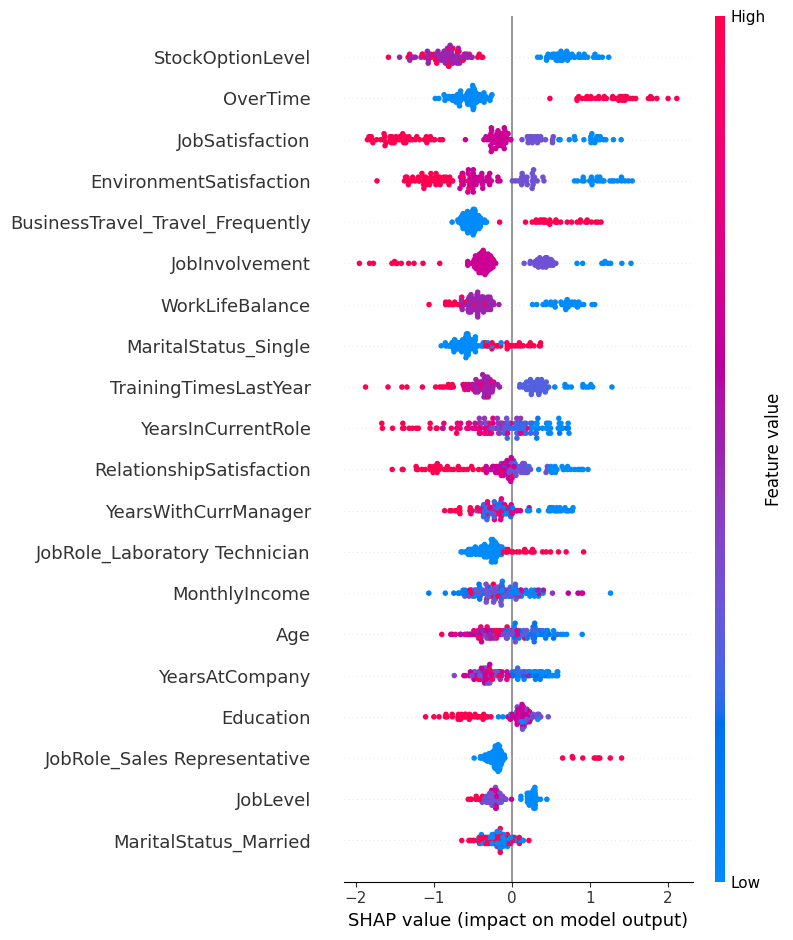

In [ ]:
shap_analysis(best_model_cb,"CatBoost",x_test, X_test_inv)

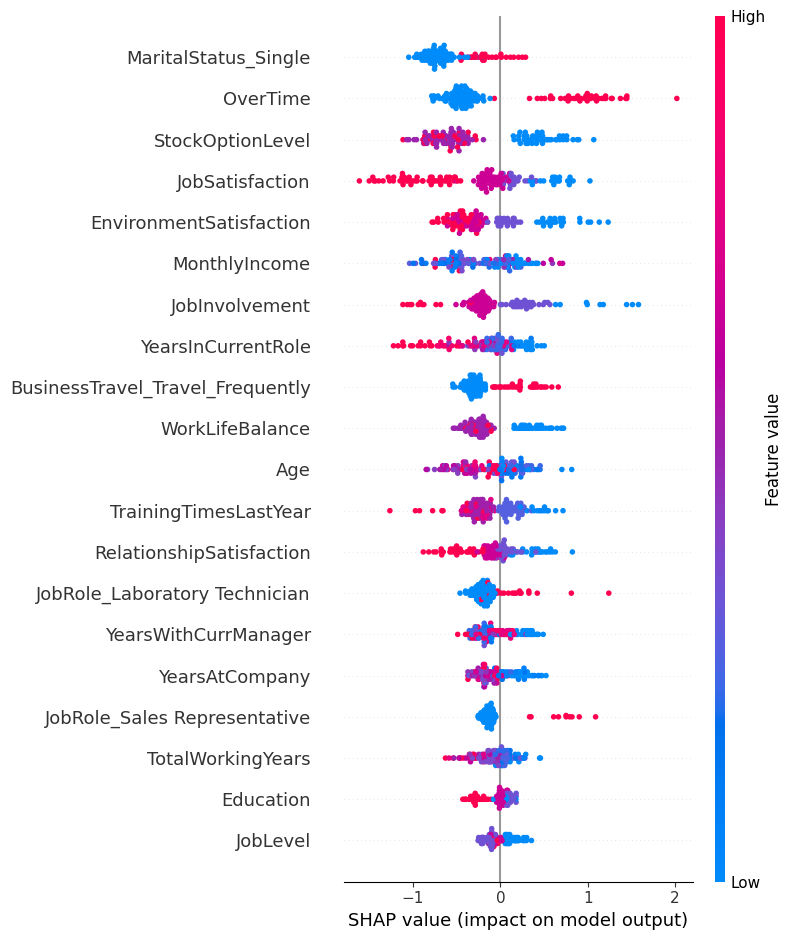

In [ ]:
shap_analysis(best_model_xgb,"XGBoost", x_test,X_test_inv)